### Step3: align 4X images to ST gene expression coord

transform the image to match with the un/sp coord

use `interpolation = cv2.INTER_NEAREST` when resize masks

note: does not consider outliers in unspliced data, if a dataset has outliers, should remove them

In [1]:
import sys
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import pickle
import cv2
import timeit

#### Load data

In [2]:
##### load un/sp data
outfile = 'output_step1/unsp_dict.pkl'

# load
with open(outfile, 'rb') as f:
    pickle_dict = pickle.load(f)
unsp_df = pickle_dict['unsp_df'] 
sp_df = pickle_dict['sp_df'] 

print(unsp_df.head())
print(sp_df.head())
print(unsp_df.tile.nunique())
print(sp_df.tile.nunique())

##### list of unique tiles
tileList = np.sort(unsp_df.tile.unique()).tolist()
print(tileList)

#### groupby tile
unsp_gbtile = unsp_df.groupby('tile')
sp_gbtile = sp_df.groupby('tile')

   tile      x      y   umi
0  2104   6995  17656  1853
1  2117  11128  15518     1
2  2102  28217  19164     1
3  2103  16048  18931     1
4  2117  25999  19552     1
   tile      x      y  umi
0  2104   6995  17656  199
1  2119  18707  15408    1
2  2119  20685   9510    1
3  2104  25803  11295    4
4  2104  10064  16363    4
10
10
[2102, 2103, 2104, 2105, 2106, 2107, 2116, 2117, 2118, 2119]


In [3]:
##### read seg of H images
filename = 'output_step2/H_seg.npy'
dat_H = np.load(filename, allow_pickle=True).item()
print(dat_H.keys())
print('img', dat_H['img'].shape)
print('outlines', dat_H['outlines'].shape)
print('masks', dat_H['masks'].shape, np.amin(dat_H['masks']), np.amax(dat_H['masks']))

##### read seg of TD images
filename = 'output_step2/TD_seg.npy'
dat_TD = np.load(filename, allow_pickle=True).item()
print(dat_TD.keys())
print('img', dat_TD['img'].shape)
print('outlines', dat_TD['outlines'].shape)
print('masks', dat_TD['masks'].shape, np.amin(dat_TD['masks']), np.amax(dat_TD['masks']))

dict_keys(['img', 'outlines', 'masks', 'chan_choose', 'ismanual', 'filename', 'flows', 'est_diam'])
img (1300, 6654)
outlines (1300, 6654)
masks (1300, 6654) 0 3791
dict_keys(['img', 'outlines', 'masks', 'chan_choose', 'ismanual', 'filename', 'flows', 'est_diam'])
img (1180, 4521)
outlines (1180, 4521)
masks (1180, 4521) 0 1794


#### Define colormaps

In [4]:
##### define alpha colormaps
# black alpha
color_array = np.zeros([10,4])
color_array[:,-1] = np.linspace(0,1,10)
map_object = colors.LinearSegmentedColormap.from_list(name='black_alpha', colors=color_array)
plt.register_cmap(cmap=map_object)
# red alpha
color_array = np.zeros([10,4])
color_array[:,0] = 1
color_array[:,-1] = np.linspace(0,1,10)
map_object = colors.LinearSegmentedColormap.from_list(name='red_alpha', colors=color_array)
plt.register_cmap(cmap=map_object)
# green alpha
color_array = np.zeros([10,4])
color_array[:,1] = 1
color_array[:,-1] = np.linspace(0,1,10)
map_object = colors.LinearSegmentedColormap.from_list(name='green_alpha', colors=color_array)
plt.register_cmap(cmap=map_object)
# blue alpha
color_array = np.zeros([10,4])
color_array[:,1] = 1
color_array[:,2] = 1
color_array[:,-1] = np.linspace(0,1,10)
map_object = colors.LinearSegmentedColormap.from_list(name='blue_alpha', colors=color_array)
plt.register_cmap(cmap=map_object)
# pink alpha
color_array = np.zeros([10,4])
color_array[:,0] = 1
color_array[:,2] = 1
color_array[:,-1] = np.linspace(0,1,10)
map_object = colors.LinearSegmentedColormap.from_list(name='pink_alpha', colors=color_array)
plt.register_cmap(cmap=map_object)
# orange alpha
color_array = np.zeros([10,4])
color_array[:,0] = 1
color_array[:,1] = 0.39
color_array[:,2] = 0.28
color_array[:,-1] = np.linspace(0,1,10)
map_object = colors.LinearSegmentedColormap.from_list(name='orange_alpha', colors=color_array)
plt.register_cmap(cmap=map_object)

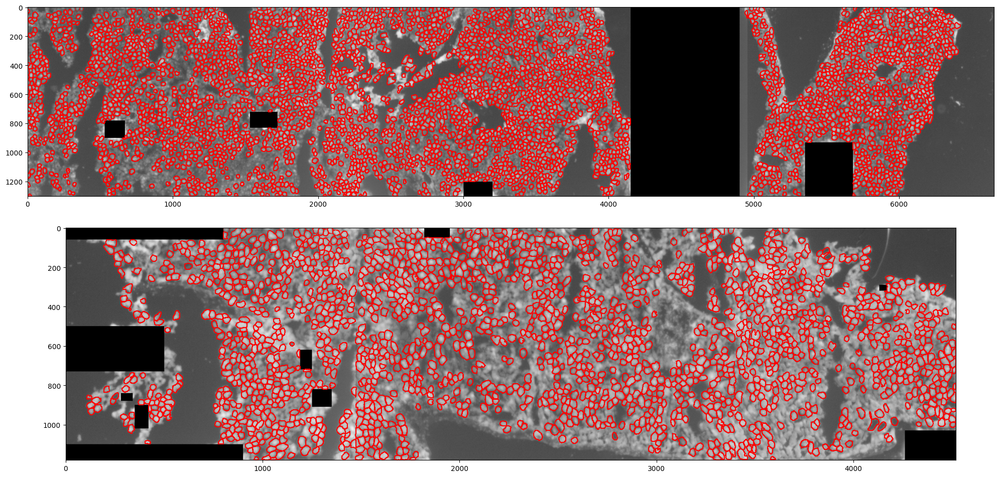

In [5]:
# viz seg_H and seg_TD

fig, ax = plt.subplots(2,1, figsize=(20,10))

# image
ax[0].imshow(dat_H['img'],
          cmap='Greys',
          origin='upper')

# outlines
ax[0].imshow(dat_H['outlines'],
          cmap='red_alpha',
          vmin=0,
          vmax=1,
          origin='upper')

ax[0].set_aspect('equal', adjustable='box')
ax[0].grid(False)

# image
ax[1].imshow(dat_TD['img'],
          cmap='Greys',
          origin='upper')

# outlines
ax[1].imshow(dat_TD['outlines'],
          cmap='red_alpha',
          vmin=0,
          vmax=1,
          origin='upper')

ax[1].set_aspect('equal', adjustable='box')
ax[1].grid(False)

plt.tight_layout()
fig.savefig('output_fig/step3_segmentation.pdf')

#### Alignment

alignment was done manually tile by tile

In [6]:
##### kernal for computing unspMat
# unspMat is the matrix showing unspliced patterns
# kernal size, odd number, 201 is good for seqscope resolution
kn = 201 # <<<
# circle kernal for computing local density
kernalCir = np.zeros((kn,kn))
for i in range(kn):
    for j in range(kn):
        if (i-int(kn/2)-1)*(i-int(kn/2)-1) + (j-int(kn/2)-1)*(j-int(kn/2)-1) < kn*kn/4:
            kernalCir[i,j] = 1

##### Tile 2107

In [7]:
##### unsp data
t = 2107 
t_sp = sp_gbtile.get_group(t) 
t_unsp = unsp_gbtile.get_group(t)

In [8]:
##### compute unspMat
start = timeit.default_timer()

# an empty matrix
unspMat = np.zeros((t_unsp.x.max()+100, t_unsp.y.max()+100), dtype=int)
print(unspMat.shape)

# compute unspMat
for i in range(t_unsp.x.size):
    if i % 1e3 == 0:
        sys.stdout.write('' * 50 + '\r' + str(i/t_unsp.x.size)) # percentage progress
        sys.stdout.flush()

    xi = t_unsp.x.iloc[i]
    yi = t_unsp.y.iloc[i]
    unspMat[int(xi-kn/2):int(xi+kn/2), int(yi-kn/2):int(yi+kn/2)] = unspMat[int(xi-kn/2):int(xi+kn/2), int(yi-kn/2):int(yi+kn/2)] + t_unsp.umi.iloc[i]*kernalCir

stop = timeit.default_timer()
print('\n Time: ', stop - start) # ~1min

(29815, 25256)
0.994939644720889854
 Time:  48.427442009560764


In [9]:
##### compute spMat
start = timeit.default_timer()

# an empty matrix
spMat = np.zeros((t_sp.x.max()+100, t_sp.y.max()+100), dtype=int)
print(spMat.shape)

# compute unspMat
for i in range(t_sp.x.size):
    if i % 1e3 == 0:
        sys.stdout.write('' * 50 + '\r' + str(i/t_sp.x.size)) # percentage progress
        sys.stdout.flush()

    xi = t_sp.x.iloc[i]
    yi = t_sp.y.iloc[i]
    spMat[int(xi-kn/2):int(xi+kn/2), int(yi-kn/2):int(yi+kn/2)] = spMat[int(xi-kn/2):int(xi+kn/2), int(yi-kn/2):int(yi+kn/2)] + t_sp.umi.iloc[i]*kernalCir

stop = timeit.default_timer()
print('\n Time: ', stop - start) # ~3min

print(np.quantile(spMat, [0.1,0.5,0.9,0.99,1]))

(29818, 25259)
0.9994707564375436564
 Time:  185.18919268529862
[  0.  58. 282. 434. 970.]


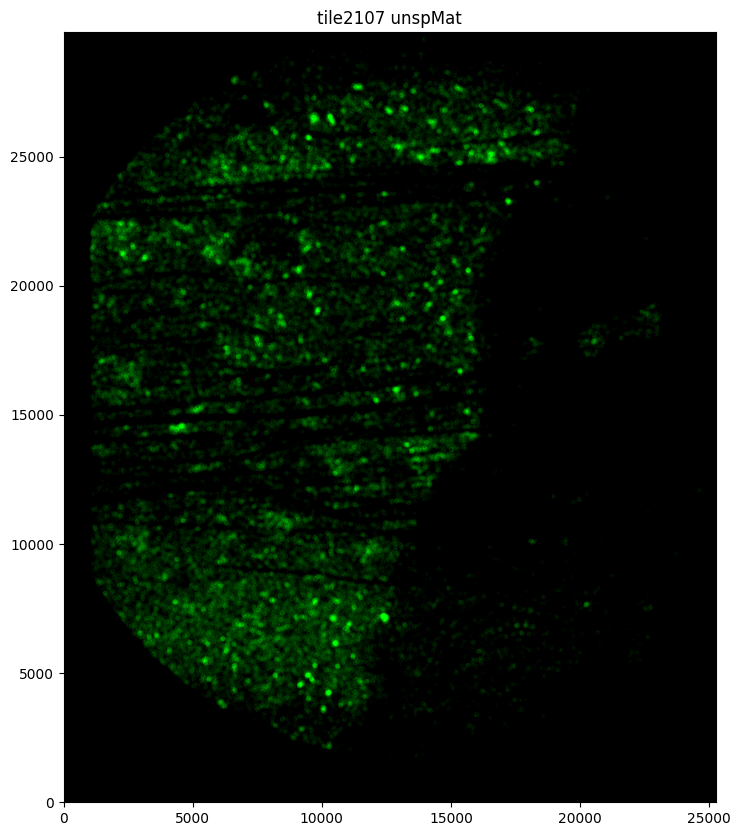

In [10]:
##### check unsp viz
fig, ax = plt.subplots(1,1, figsize=(10,10))
ax.imshow(unspMat, 
          cmap='green_alpha',
          vmin=10,
          vmax=100,
          origin='lower')

ax.set_aspect('equal', adjustable='box')
ax.set_title('tile'+str(t)+' unspMat')
ax.grid(False)
ax.set_facecolor('black')
# plt.tight_layout()

In [11]:
##### transform image to align with unspMat

# original im and outlines
im = dat_H['img']
outlines = dat_H['outlines']
masks = dat_H['masks']

# 1. crop
# points for cropped image
left = 5600 # <<<<<
top = 120 # <<<<<
right = 6500 # <<<<<
bottom = 1300 # <<<<<

im1 = im[top:bottom, left:right]
outlines1 = outlines[top:bottom, left:right]
masks1 = masks[top:bottom, left:right]

# 2. resize
height, width = list(im1.shape)
dim2 = (int(width*9.3*2.5), int(height*9.1*2.5)) # <<<

im2 = cv2.resize(im1, dim2, interpolation = cv2.INTER_NEAREST)
outlines2 = cv2.resize(outlines1, dim2, interpolation = cv2.INTER_NEAREST)
masks2 = cv2.resize(masks1, dim2, interpolation = cv2.INTER_NEAREST)

# 3. flip
im3 = np.flip(im2, axis=0)
outlines3 = np.flip(outlines2, axis=0)
masks3 = np.flip(masks2, axis=0)

# 4. padding
dim4 = list(unspMat.shape)
im4 = np.full(dim4,255)
outlines4 = np.zeros(dim4)
masks4 = np.zeros(dim4)

left = 1000 # <<<
top = 2000 # <<<

im4[top:(top+dim2[1]), left:(left+dim2[0])] = im3
outlines4[top:(top+dim2[1]), left:(left+dim2[0])] = outlines3
masks4[top:(top+dim2[1]), left:(left+dim2[0])] = masks3

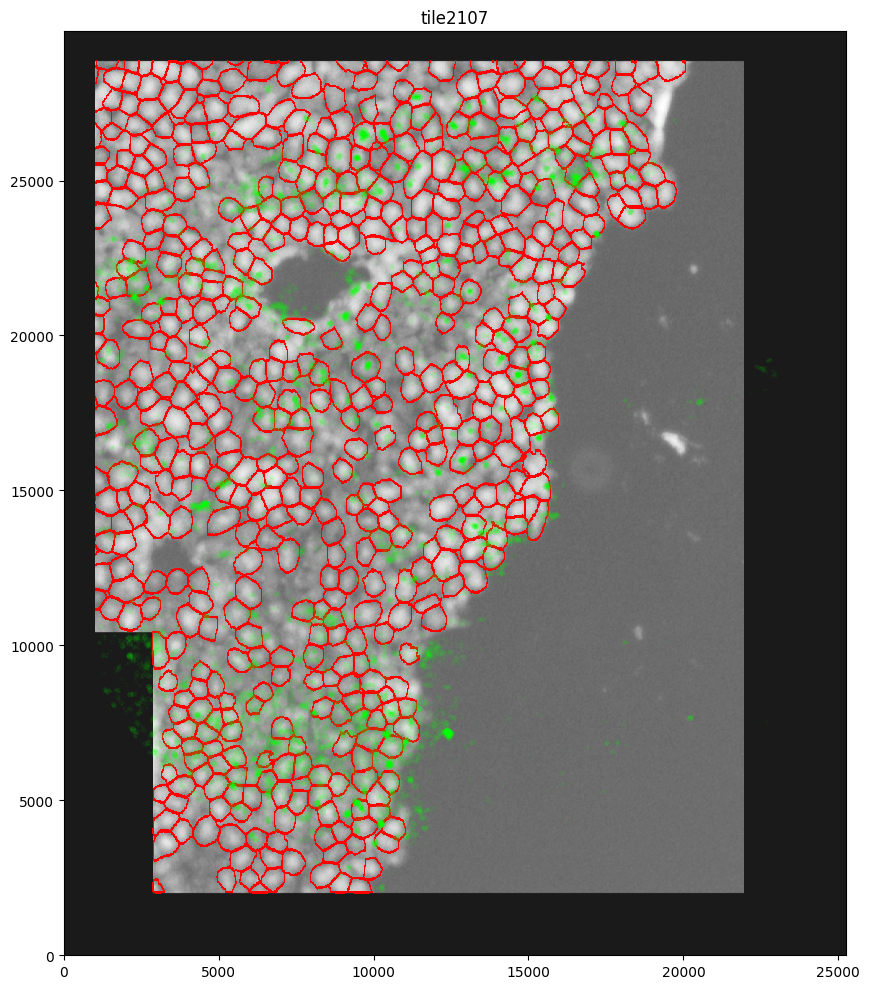

In [12]:
##### overlay image + unspMat

fig, ax = plt.subplots(1,1, figsize=(10,10))

# image
ax.imshow(im4, 
          alpha=0.9, 
          cmap='Greys',
          origin='lower')
# outlines
ax.imshow(outlines4, alpha=1, vmin=0, vmax=2, cmap='red_alpha',
          origin='lower')
# unspMat
ax.imshow(unspMat, 
          cmap='green_alpha',
          vmin=20,
          vmax=100,
          origin='lower')

ax.set_aspect('equal', adjustable='box')

# mask
# ax[1].imshow((masks4==410)*1, alpha=1, cmap='jet',
#              origin='lower')
# ax[1].set_aspect('equal', adjustable='box')

ax.set_title('tile'+str(t))
# ax.grid(False)
# ax.set_facecolor('black')
# plt.suptitle('sp+unsp\n\n')
plt.tight_layout()
fig.savefig('output_fig/step3_align_tile'+str(t)+'.pdf')

In [13]:
##### save aligned segmentation mask (that is aligned with spatial gene expression)
print(im4.shape, outlines4.shape, masks4.shape, unspMat.shape, spMat.shape)

outfile = 'output_step3/masks_4X_tile'+str(t)+'_dict.pkl'
# save
pickle_dict = {}
pickle_dict['im'+str(t)] = im4
pickle_dict['outline'+str(t)] = outlines4
pickle_dict['mask'+str(t)] = masks4
pickle_dict['unspMat'+str(t)] = unspMat
pickle_dict['spMat'+str(t)] = spMat
with open(outfile, 'wb') as f:
    pickle.dump(pickle_dict, f)

(29815, 25256) (29815, 25256) (29815, 25256) (29815, 25256) (29818, 25259)


##### Tile 2102

all the following tiles are processed similarly

In [14]:
##### unsp data
t = 2102
t_sp = sp_gbtile.get_group(t) 
t_unsp = unsp_gbtile.get_group(t)

In [15]:
##### compute unspMat
start = timeit.default_timer()

# an empty matrix
unspMat = np.zeros((t_unsp.x.max()+100, t_unsp.y.max()+100), dtype=int)
print(unspMat.shape)

# compute unspMat
for i in range(t_unsp.x.size):
    if i % 1e3 == 0:
        sys.stdout.write('' * 50 + '\r' + str(i/t_unsp.x.size)) # percentage progress
        sys.stdout.flush()

    xi = t_unsp.x.iloc[i]
    yi = t_unsp.y.iloc[i]
    unspMat[int(xi-kn/2):int(xi+kn/2), int(yi-kn/2):int(yi+kn/2)] = unspMat[int(xi-kn/2):int(xi+kn/2), int(yi-kn/2):int(yi+kn/2)] + t_unsp.umi.iloc[i]*kernalCir

stop = timeit.default_timer()
print('\n Time: ', stop - start) # ~1min

(29818, 25242)
0.995462856368930754
 Time:  46.201839306391776


In [16]:
##### compute spMat
start = timeit.default_timer()

# an empty matrix
spMat = np.zeros((t_sp.x.max()+100, t_sp.y.max()+100), dtype=int)
print(spMat.shape)

# compute unspMat
for i in range(t_sp.x.size):
    if i % 1e3 == 0:
        sys.stdout.write('' * 50 + '\r' + str(i/t_sp.x.size)) # percentage progress
        sys.stdout.flush()

    xi = t_sp.x.iloc[i]
    yi = t_sp.y.iloc[i]
    spMat[int(xi-kn/2):int(xi+kn/2), int(yi-kn/2):int(yi+kn/2)] = spMat[int(xi-kn/2):int(xi+kn/2), int(yi-kn/2):int(yi+kn/2)] + t_sp.umi.iloc[i]*kernalCir

stop = timeit.default_timer()
print('\n Time: ', stop - start) # ~3min

print(np.quantile(spMat, [0.1,0.5,0.9,0.99,1]))

(29818, 25244)
0.9982393690249615365
 Time:  175.07507569156587
[  0.  66. 181. 300. 643.]


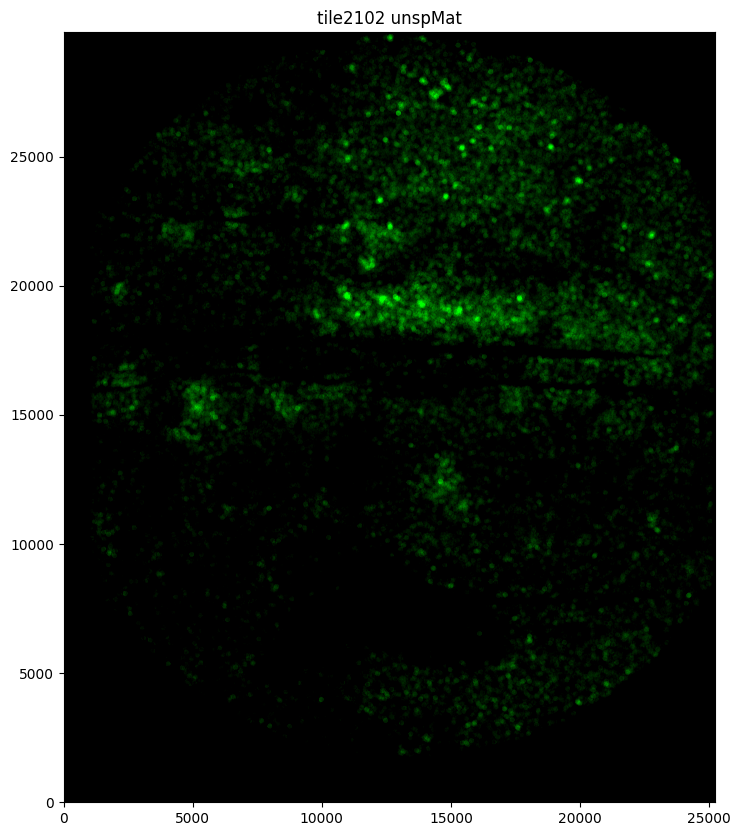

In [21]:
##### check unsp viz
fig, ax = plt.subplots(1,1, figsize=(10,10))
ax.imshow(unspMat, 
          cmap='green_alpha',
          vmin=10,
          vmax=100,
          origin='lower')

ax.set_aspect('equal', adjustable='box')
ax.set_title('tile'+str(t)+' unspMat')
ax.grid(False)
ax.set_facecolor('black')
# plt.tight_layout()

In [18]:
##### transform image to align with unspMat

# original im and outlines
im = dat_H['img']
outlines = dat_H['outlines']
masks = dat_H['masks']

# 1. crop
# points for cropped image
left = 50 # <<<<<
top = 150 # <<<<<
right = 1000 # <<<<<
bottom = 1300 # <<<<<

im1 = im[top:bottom, left:right]
outlines1 = outlines[top:bottom, left:right]
masks1 = masks[top:bottom, left:right]

# 2. resize
height, width = list(im1.shape)
dim2 = (int(width*9.3*2.5), int(height*9.1*2.5)) # <<<

im2 = cv2.resize(im1, dim2, interpolation = cv2.INTER_NEAREST)
outlines2 = cv2.resize(outlines1, dim2, interpolation = cv2.INTER_NEAREST)
masks2 = cv2.resize(masks1, dim2, interpolation = cv2.INTER_NEAREST)

# 3. flip
im3 = np.flip(im2, axis=0)
outlines3 = np.flip(outlines2, axis=0)
masks3 = np.flip(masks2, axis=0)

# 4. padding
dim4 = list(unspMat.shape)
im4 = np.full(dim4,255)
outlines4 = np.zeros(dim4)
masks4 = np.zeros(dim4)

left = 2100 # <<<
top = 500 # <<<

im4[top:(top+dim2[1]), left:(left+dim2[0])] = im3
outlines4[top:(top+dim2[1]), left:(left+dim2[0])] = outlines3
masks4[top:(top+dim2[1]), left:(left+dim2[0])] = masks3

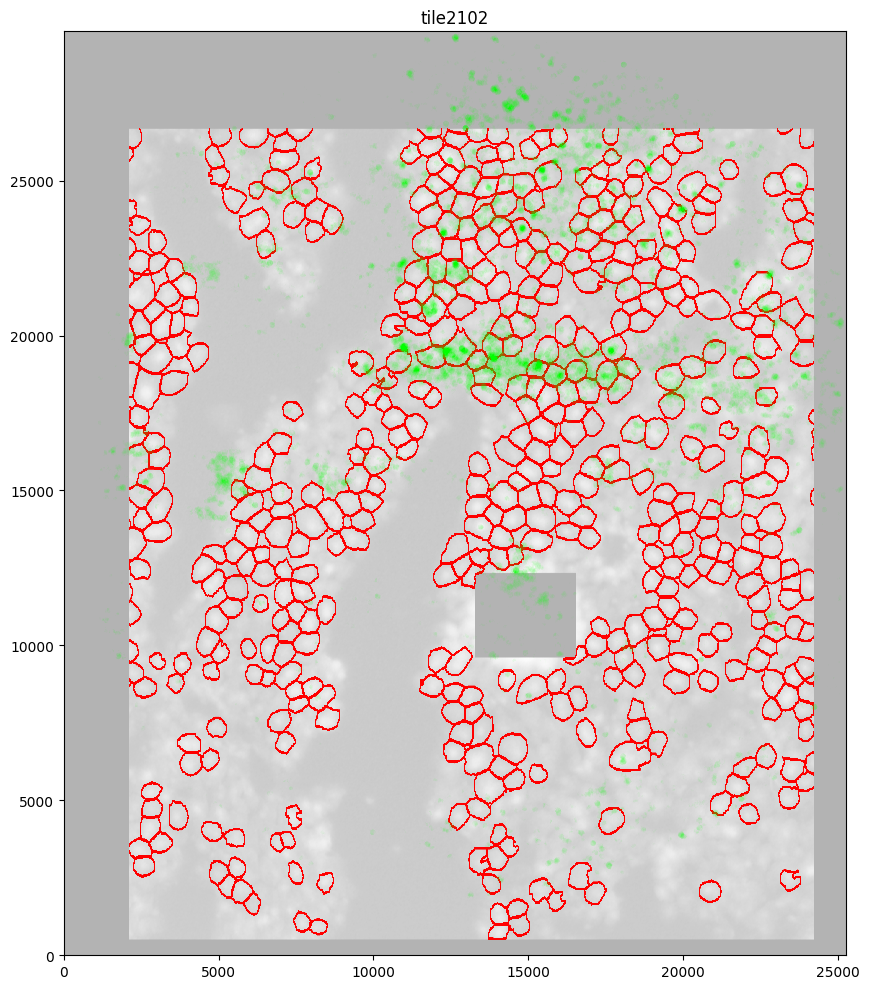

In [22]:
##### overlay image + unspMat

fig, ax = plt.subplots(1,1, figsize=(10,10))

# image
ax.imshow(im4, 
          alpha=0.3, 
          cmap='Greys',
          origin='lower')
# outlines
ax.imshow(outlines4, alpha=1, vmin=0, vmax=2, cmap='red_alpha',
          origin='lower')
# unspMat
ax.imshow(unspMat, 
          cmap='green_alpha',
          vmin=20,
          vmax=100,
          origin='lower')

ax.set_aspect('equal', adjustable='box')


# mask
# ax[1].imshow((masks4==410)*1, alpha=1, cmap='jet',
#              origin='lower')
# ax[1].set_aspect('equal', adjustable='box')

ax.set_title('tile'+str(t))
# ax.grid(False)
# ax.set_facecolor('black')
# plt.suptitle('sp+unsp\n\n')
plt.tight_layout()
fig.savefig('output_fig/step3_align_tile'+str(t)+'.pdf')

In [20]:
##### save aligned segmentation mask (that is aligned with spatial gene expression)
print(im4.shape, outlines4.shape, masks4.shape, unspMat.shape, spMat.shape)

outfile = 'output_step3/masks_4X_tile'+str(t)+'_dict.pkl'
# save
pickle_dict = {}
pickle_dict['im'+str(t)] = im4
pickle_dict['outline'+str(t)] = outlines4
pickle_dict['mask'+str(t)] = masks4
pickle_dict['unspMat'+str(t)] = unspMat
pickle_dict['spMat'+str(t)] = spMat
with open(outfile, 'wb') as f:
    pickle.dump(pickle_dict, f)

(29818, 25242) (29818, 25242) (29818, 25242) (29818, 25242) (29818, 25244)


##### Tile 2103

In [23]:
##### unsp data
t = 2103
t_sp = sp_gbtile.get_group(t) 
t_unsp = unsp_gbtile.get_group(t)

In [24]:
##### compute unspMat
start = timeit.default_timer()

# an empty matrix
unspMat = np.zeros((t_unsp.x.max()+100, t_unsp.y.max()+100), dtype=int)
print(unspMat.shape)

# compute unspMat
for i in range(t_unsp.x.size):
    if i % 1e3 == 0:
        sys.stdout.write('' * 50 + '\r' + str(i/t_unsp.x.size)) # percentage progress
        sys.stdout.flush()

    xi = t_unsp.x.iloc[i]
    yi = t_unsp.y.iloc[i]
    unspMat[int(xi-kn/2):int(xi+kn/2), int(yi-kn/2):int(yi+kn/2)] = unspMat[int(xi-kn/2):int(xi+kn/2), int(yi-kn/2):int(yi+kn/2)] + t_unsp.umi.iloc[i]*kernalCir

stop = timeit.default_timer()
print('\n Time: ', stop - start) # ~1min

(29818, 25242)
0.998760159801625636
 Time:  55.97041009645909


In [25]:
##### compute spMat
start = timeit.default_timer()

# an empty matrix
spMat = np.zeros((t_sp.x.max()+100, t_sp.y.max()+100), dtype=int)
print(spMat.shape)

# compute unspMat
for i in range(t_sp.x.size):
    if i % 1e3 == 0:
        sys.stdout.write('' * 50 + '\r' + str(i/t_sp.x.size)) # percentage progress
        sys.stdout.flush()

    xi = t_sp.x.iloc[i]
    yi = t_sp.y.iloc[i]
    spMat[int(xi-kn/2):int(xi+kn/2), int(yi-kn/2):int(yi+kn/2)] = spMat[int(xi-kn/2):int(xi+kn/2), int(yi-kn/2):int(yi+kn/2)] + t_sp.umi.iloc[i]*kernalCir

stop = timeit.default_timer()
print('\n Time: ', stop - start) # ~3min

print(np.quantile(spMat, [0.1,0.5,0.9,0.99,1]))

(29818, 25244)
0.9987727599008945765
 Time:  212.77651253156364
[  0. 113. 217. 317. 848.]


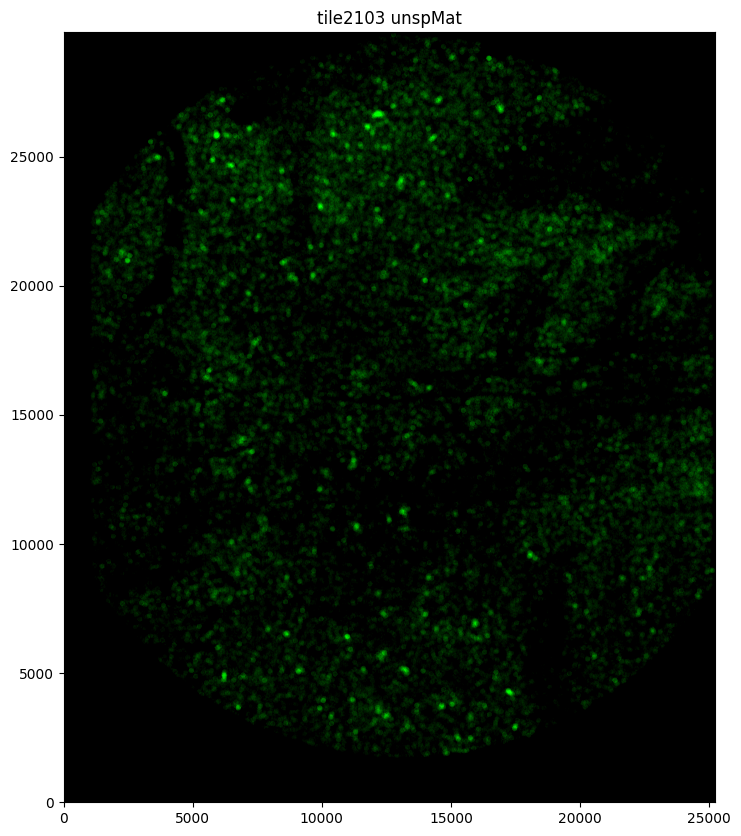

In [29]:
##### check unsp viz
fig, ax = plt.subplots(1,1, figsize=(10,10))
ax.imshow(unspMat, 
          cmap='green_alpha',
          vmin=10,
          vmax=100,
          origin='lower')

ax.set_aspect('equal', adjustable='box')
ax.set_title('tile'+str(t)+' unspMat')
ax.grid(False)
ax.set_facecolor('black')
# plt.tight_layout()

In [30]:
##### transform image to align with unspMat

# original im and outlines
im = dat_H['img']
outlines = dat_H['outlines']
masks = dat_H['masks']

# 1. crop
# points for cropped image
left = 1200 # <<<<<
top = 120 # <<<<<
right = 2150 # <<<<<
bottom = 1300 # <<<<<

im1 = im[top:bottom, left:right]
outlines1 = outlines[top:bottom, left:right]
masks1 = masks[top:bottom, left:right]

# 2. resize
height, width = list(im1.shape)
dim2 = (int(width*9.3*2.5), int(height*9.1*2.5)) # <<<

im2 = cv2.resize(im1, dim2, interpolation = cv2.INTER_NEAREST)
outlines2 = cv2.resize(outlines1, dim2, interpolation = cv2.INTER_NEAREST)
masks2 = cv2.resize(masks1, dim2, interpolation = cv2.INTER_NEAREST)

# 3. flip
im3 = np.flip(im2, axis=0)
outlines3 = np.flip(outlines2, axis=0)
masks3 = np.flip(masks2, axis=0)

# 4. padding
dim4 = list(unspMat.shape)
im4 = np.full(dim4,255)
outlines4 = np.zeros(dim4)
masks4 = np.zeros(dim4)

left = 2000 # <<<
top = 1200 # <<<

im4[top:(top+dim2[1]), left:(left+dim2[0])] = im3
outlines4[top:(top+dim2[1]), left:(left+dim2[0])] = outlines3
masks4[top:(top+dim2[1]), left:(left+dim2[0])] = masks3

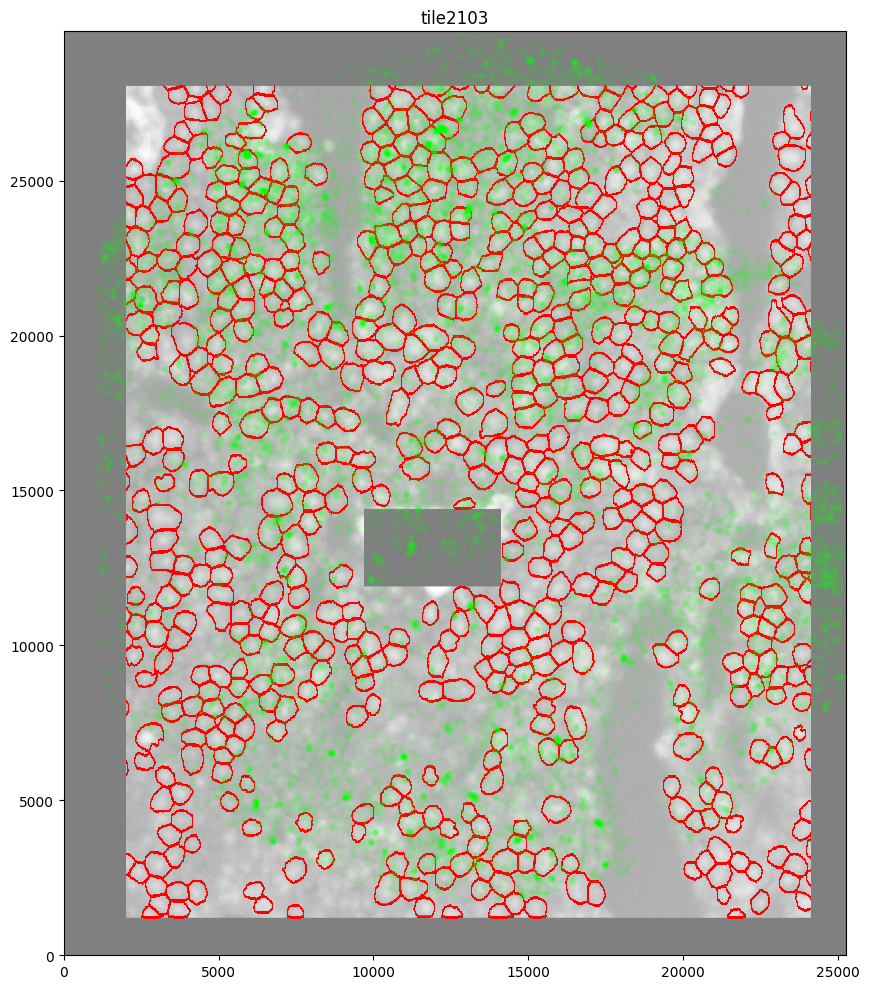

In [31]:
##### overlay image + unspMat

fig, ax = plt.subplots(1,1, figsize=(10,10))

# image
ax.imshow(im4, 
          alpha=0.5, 
          cmap='Greys',
          origin='lower')
# outlines
ax.imshow(outlines4, alpha=1, vmin=0, vmax=2, cmap='red_alpha',
          origin='lower')
# unspMat
ax.imshow(unspMat, 
          cmap='green_alpha',
          vmin=10,
          vmax=80,
          origin='lower')

ax.set_aspect('equal', adjustable='box')


# mask
# ax[1].imshow((masks4==410)*1, alpha=1, cmap='jet',
#              origin='lower')
# ax[1].set_aspect('equal', adjustable='box')

ax.set_title('tile'+str(t))
# ax.grid(False)
# ax.set_facecolor('black')
# plt.suptitle('sp+unsp\n\n')
plt.tight_layout()
fig.savefig('output_fig/step3_align_tile'+str(t)+'.pdf')

In [32]:
##### save aligned segmentation mask (that is aligned with spatial gene expression)
print(im4.shape, outlines4.shape, masks4.shape, unspMat.shape, spMat.shape)

outfile = 'output_step3/masks_4X_tile'+str(t)+'_dict.pkl'
# save
pickle_dict = {}
pickle_dict['im'+str(t)] = im4
pickle_dict['outline'+str(t)] = outlines4
pickle_dict['mask'+str(t)] = masks4
pickle_dict['unspMat'+str(t)] = unspMat
pickle_dict['spMat'+str(t)] = spMat
with open(outfile, 'wb') as f:
    pickle.dump(pickle_dict, f)

(29818, 25242) (29818, 25242) (29818, 25242) (29818, 25242) (29818, 25244)


##### Tile 2104

In [33]:
##### unsp data
t = 2104
t_sp = sp_gbtile.get_group(t) 
t_unsp = unsp_gbtile.get_group(t)

In [34]:
##### compute unspMat
start = timeit.default_timer()

# an empty matrix
unspMat = np.zeros((t_unsp.x.max()+100, t_unsp.y.max()+100), dtype=int)
print(unspMat.shape)

# compute unspMat
for i in range(t_unsp.x.size):
    if i % 1e3 == 0:
        sys.stdout.write('' * 50 + '\r' + str(i/t_unsp.x.size)) # percentage progress
        sys.stdout.flush()

    xi = t_unsp.x.iloc[i]
    yi = t_unsp.y.iloc[i]
    unspMat[int(xi-kn/2):int(xi+kn/2), int(yi-kn/2):int(yi+kn/2)] = unspMat[int(xi-kn/2):int(xi+kn/2), int(yi-kn/2):int(yi+kn/2)] + t_unsp.umi.iloc[i]*kernalCir

stop = timeit.default_timer()
print('\n Time: ', stop - start) # ~1min

(29809, 25247)
0.996163841108773776
 Time:  51.11341704707593


In [35]:
##### compute spMat
start = timeit.default_timer()

# an empty matrix
spMat = np.zeros((t_sp.x.max()+100, t_sp.y.max()+100), dtype=int)
print(spMat.shape)

# compute unspMat
for i in range(t_sp.x.size):
    if i % 1e3 == 0:
        sys.stdout.write('' * 50 + '\r' + str(i/t_sp.x.size)) # percentage progress
        sys.stdout.flush()

    xi = t_sp.x.iloc[i]
    yi = t_sp.y.iloc[i]
    spMat[int(xi-kn/2):int(xi+kn/2), int(yi-kn/2):int(yi+kn/2)] = spMat[int(xi-kn/2):int(xi+kn/2), int(yi-kn/2):int(yi+kn/2)] + t_sp.umi.iloc[i]*kernalCir

stop = timeit.default_timer()
print('\n Time: ', stop - start) # ~3min

print(np.quantile(spMat, [0.1,0.5,0.9,0.99,1]))

(29816, 25248)
0.999641575882331766
 Time:  186.56257648393512
[  0. 104. 237. 340. 778.]


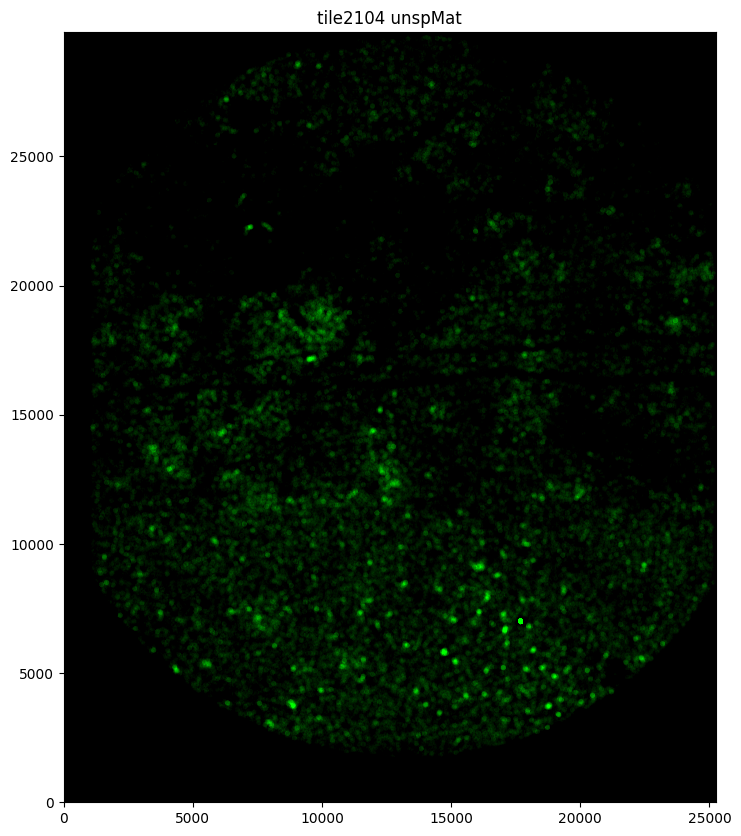

In [36]:
##### check unsp viz
fig, ax = plt.subplots(1,1, figsize=(10,10))
ax.imshow(unspMat, 
          cmap='green_alpha',
          vmin=10,
          vmax=100,
          origin='lower')

ax.set_aspect('equal', adjustable='box')
ax.set_title('tile'+str(t)+' unspMat')
ax.grid(False)
ax.set_facecolor('black')
# plt.tight_layout()

In [37]:
##### transform image to align with unspMat

# original im and outlines
im = dat_H['img']
outlines = dat_H['outlines']
masks = dat_H['masks']

# 1. crop
# points for cropped image
left = 2250 # <<<<<
top = 120 # <<<<<
right = 3250 # <<<<<
bottom = 1300 # <<<<<

im1 = im[top:bottom, left:right]
outlines1 = outlines[top:bottom, left:right]
masks1 = masks[top:bottom, left:right]

# 2. resize
height, width = list(im1.shape)
dim2 = (int(width*9.3*2.5), int(height*9.1*2.5)) # <<<

im2 = cv2.resize(im1, dim2, interpolation = cv2.INTER_NEAREST)
outlines2 = cv2.resize(outlines1, dim2, interpolation = cv2.INTER_NEAREST)
masks2 = cv2.resize(masks1, dim2, interpolation = cv2.INTER_NEAREST)

# 3. flip
im3 = np.flip(im2, axis=0)
outlines3 = np.flip(outlines2, axis=0)
masks3 = np.flip(masks2, axis=0)

# 4. padding
dim4 = list(unspMat.shape)
im4 = np.full(dim4,255)
outlines4 = np.zeros(dim4)
masks4 = np.zeros(dim4)

left = 1100 # <<<
top = 700 # <<<

im4[top:(top+dim2[1]), left:(left+dim2[0])] = im3
outlines4[top:(top+dim2[1]), left:(left+dim2[0])] = outlines3
masks4[top:(top+dim2[1]), left:(left+dim2[0])] = masks3

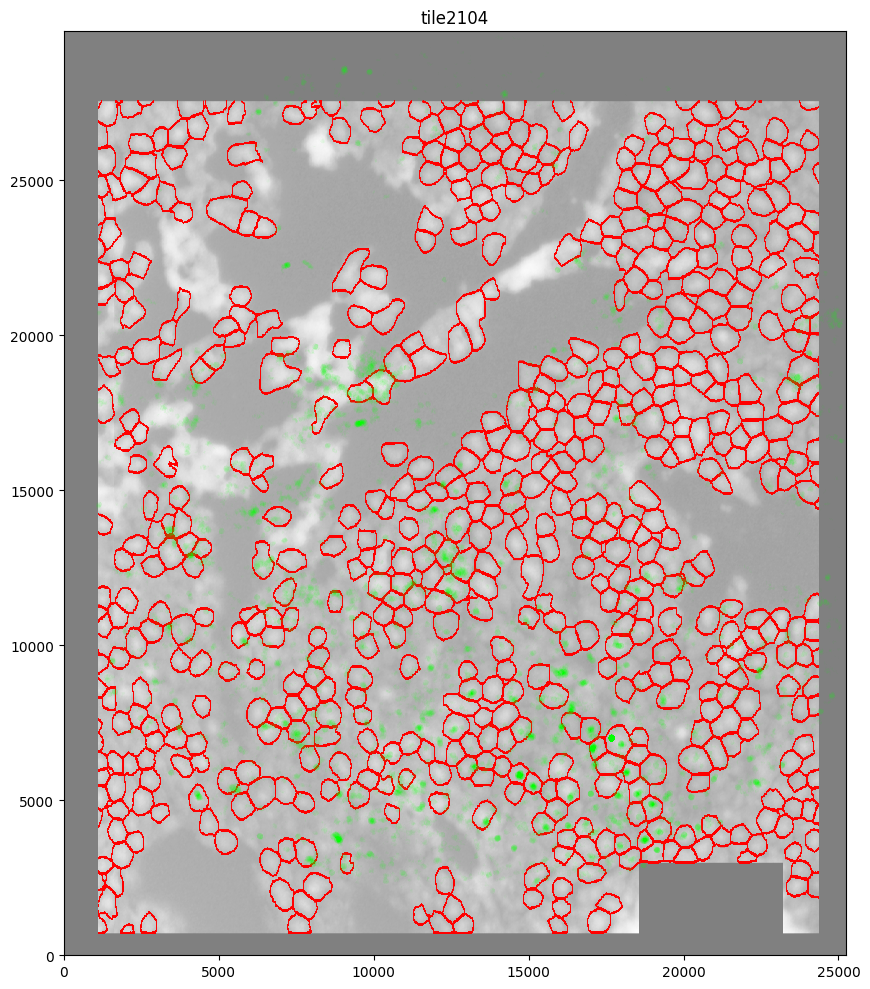

In [38]:
##### overlay image + unspMat

fig, ax = plt.subplots(1,1, figsize=(10,10))

# image
ax.imshow(im4, 
          alpha=0.5, 
          cmap='Greys',
          origin='lower')
# outlines
ax.imshow(outlines4, alpha=1, vmin=0, vmax=2, cmap='red_alpha',
          origin='lower')
# unspMat
ax.imshow(unspMat, 
          cmap='green_alpha',
          vmin=20,
          vmax=100,
          origin='lower')

ax.set_aspect('equal', adjustable='box')


# mask
# ax[1].imshow((masks4==410)*1, alpha=1, cmap='jet',
#              origin='lower')
# ax[1].set_aspect('equal', adjustable='box')

ax.set_title('tile'+str(t))
# ax.grid(False)
# ax.set_facecolor('black')
# plt.suptitle('sp+unsp\n\n')
plt.tight_layout()
fig.savefig('output_fig/step3_align_tile'+str(t)+'.pdf')

In [40]:
##### save aligned segmentation mask (that is aligned with spatial gene expression)
print(im4.shape, outlines4.shape, masks4.shape, unspMat.shape, spMat.shape)

outfile = 'output_step3/masks_4X_tile'+str(t)+'_dict.pkl'
# save
pickle_dict = {}
pickle_dict['im'+str(t)] = im4
pickle_dict['outline'+str(t)] = outlines4
pickle_dict['mask'+str(t)] = masks4
pickle_dict['unspMat'+str(t)] = unspMat
pickle_dict['spMat'+str(t)] = spMat
with open(outfile, 'wb') as f:
    pickle.dump(pickle_dict, f)

(29809, 25247) (29809, 25247) (29809, 25247) (29809, 25247) (29816, 25248)


##### Tile 2105

In [41]:
##### unsp data
t = 2105
t_sp = sp_gbtile.get_group(t) 
t_unsp = unsp_gbtile.get_group(t)

In [42]:
##### compute unspMat
start = timeit.default_timer()

# an empty matrix
unspMat = np.zeros((t_unsp.x.max()+100, t_unsp.y.max()+100), dtype=int)
print(unspMat.shape)

# compute unspMat
for i in range(t_unsp.x.size):
    if i % 1e3 == 0:
        sys.stdout.write('' * 50 + '\r' + str(i/t_unsp.x.size)) # percentage progress
        sys.stdout.flush()

    xi = t_unsp.x.iloc[i]
    yi = t_unsp.y.iloc[i]
    unspMat[int(xi-kn/2):int(xi+kn/2), int(yi-kn/2):int(yi+kn/2)] = unspMat[int(xi-kn/2):int(xi+kn/2), int(yi-kn/2):int(yi+kn/2)] + t_unsp.umi.iloc[i]*kernalCir

stop = timeit.default_timer()
print('\n Time: ', stop - start) # ~1min

(29786, 25243)
0.993366445548185466
 Time:  46.779405667446554


In [43]:
##### compute spMat
start = timeit.default_timer()

# an empty matrix
spMat = np.zeros((t_sp.x.max()+100, t_sp.y.max()+100), dtype=int)
print(spMat.shape)

# compute unspMat
for i in range(t_sp.x.size):
    if i % 1e3 == 0:
        sys.stdout.write('' * 50 + '\r' + str(i/t_sp.x.size)) # percentage progress
        sys.stdout.flush()

    xi = t_sp.x.iloc[i]
    yi = t_sp.y.iloc[i]
    spMat[int(xi-kn/2):int(xi+kn/2), int(yi-kn/2):int(yi+kn/2)] = spMat[int(xi-kn/2):int(xi+kn/2), int(yi-kn/2):int(yi+kn/2)] + t_sp.umi.iloc[i]*kernalCir

stop = timeit.default_timer()
print('\n Time: ', stop - start) # ~3min

print(np.quantile(spMat, [0.1,0.5,0.9,0.99,1]))

(29813, 25246)
0.9996781274853582565
 Time:  175.73151034116745
[  0.  82. 220. 338. 683.]


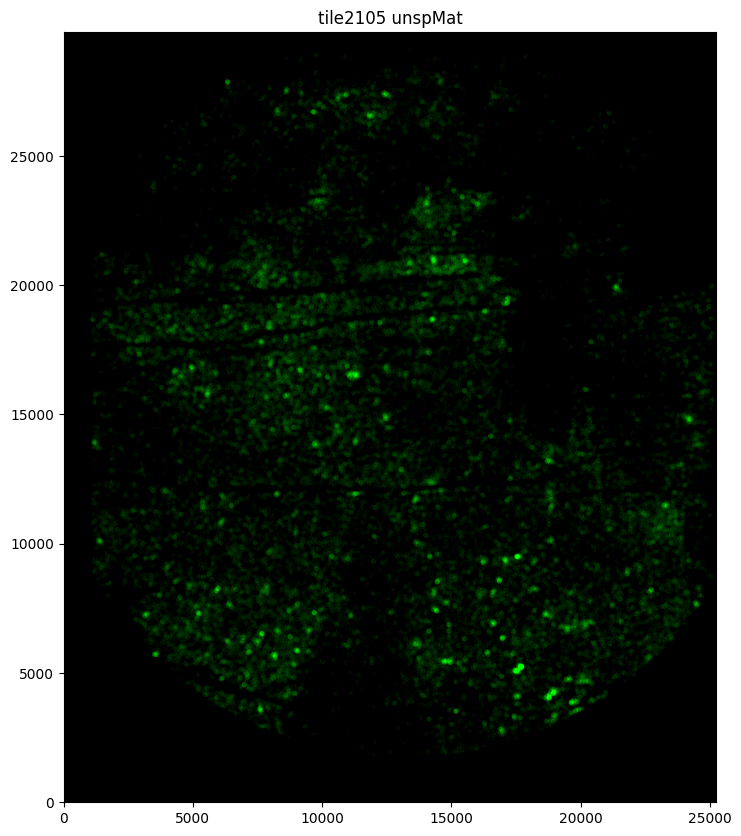

In [44]:
##### check unsp viz
fig, ax = plt.subplots(1,1, figsize=(10,10))
ax.imshow(unspMat, 
          cmap='green_alpha',
          vmin=10,
          vmax=100,
          origin='lower')

ax.set_aspect('equal', adjustable='box')
ax.set_title('tile'+str(t)+' unspMat')
ax.grid(False)
ax.set_facecolor('black')
# plt.tight_layout()

In [45]:
##### transform image to align with unspMat

# original im and outlines
im = dat_H['img']
outlines = dat_H['outlines']
masks = dat_H['masks']

# 1. crop
# points for cropped image
left = 3350 # <<<<<
top = 120 # <<<<<
right = 4200 # <<<<<
bottom = 1300 # <<<<<

im1 = im[top:bottom, left:right]
outlines1 = outlines[top:bottom, left:right]
masks1 = masks[top:bottom, left:right]

# 2. resize
height, width = list(im1.shape)
dim2 = (int(width*9.3*2.5), int(height*9.1*2.5)) # <<<

im2 = cv2.resize(im1, dim2, interpolation = cv2.INTER_NEAREST)
outlines2 = cv2.resize(outlines1, dim2, interpolation = cv2.INTER_NEAREST)
masks2 = cv2.resize(masks1, dim2, interpolation = cv2.INTER_NEAREST)

# 3. flip
im3 = np.flip(im2, axis=0)
outlines3 = np.flip(outlines2, axis=0)
masks3 = np.flip(masks2, axis=0)

# 4. padding
dim4 = list(unspMat.shape)
im4 = np.zeros(dim4)
outlines4 = np.zeros(dim4)
masks4 = np.zeros(dim4)

left = 700 # <<<
top = 1100 # <<<

im4[top:(top+dim2[1]), left:(left+dim2[0])] = im3
outlines4[top:(top+dim2[1]), left:(left+dim2[0])] = outlines3
masks4[top:(top+dim2[1]), left:(left+dim2[0])] = masks3

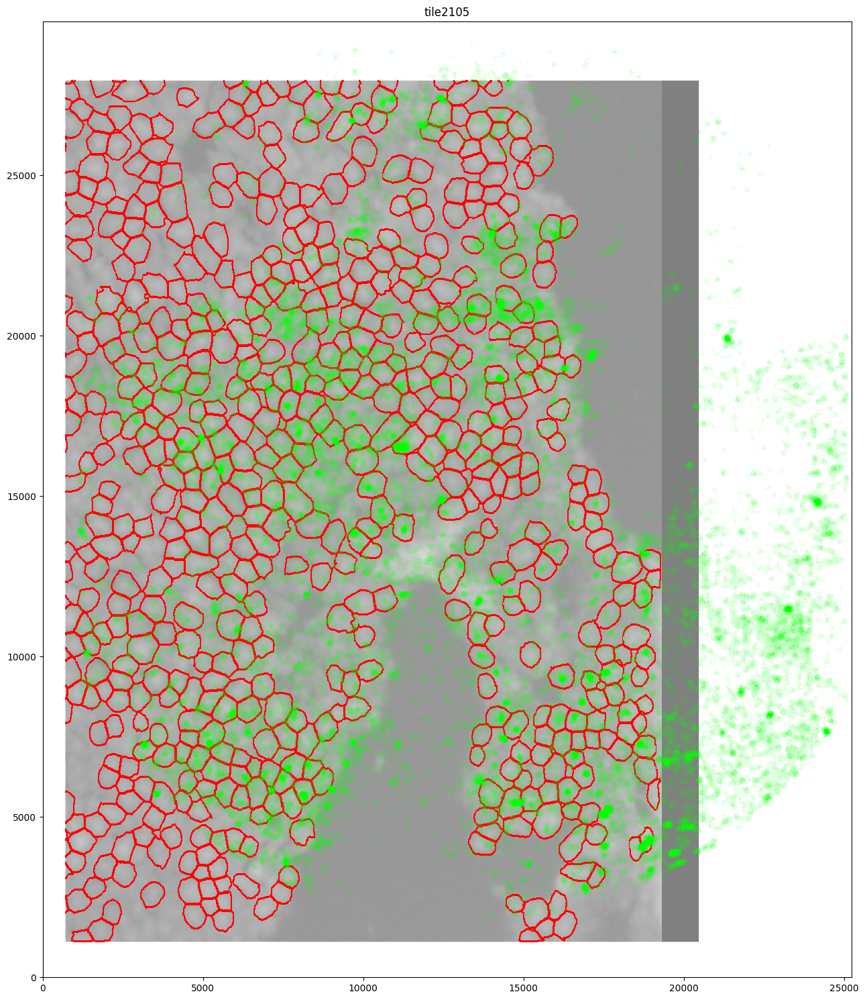

In [46]:
##### overlay image + unspMat

fig, ax = plt.subplots(1,1, figsize=(15,15))

# image
ax.imshow(im4, 
          alpha=0.5, 
          cmap='Greys',
          origin='lower')
# outlines
ax.imshow(outlines4, alpha=1, vmin=0, vmax=2, cmap='red_alpha',
          origin='lower')
# unspMat
ax.imshow(unspMat, 
          cmap='green_alpha',
          vmin=10,
          vmax=60,
          origin='lower')

ax.set_aspect('equal', adjustable='box')


# mask
# ax[1].imshow((masks4==410)*1, alpha=1, cmap='jet',
#              origin='lower')
# ax[1].set_aspect('equal', adjustable='box')

ax.set_title('tile'+str(t))
# ax.grid(False)
# ax.set_facecolor('black')
# plt.suptitle('sp+unsp\n\n')
plt.tight_layout()
fig.savefig('output_fig/step3_align_tile'+str(t)+'.pdf')

In [47]:
##### save aligned segmentation mask (that is aligned with spatial gene expression)
print(im4.shape, outlines4.shape, masks4.shape, unspMat.shape, spMat.shape)

outfile = 'output_step3/masks_4X_tile'+str(t)+'_dict.pkl'
# save
pickle_dict = {}
pickle_dict['im'+str(t)] = im4
pickle_dict['outline'+str(t)] = outlines4
pickle_dict['mask'+str(t)] = masks4
pickle_dict['unspMat'+str(t)] = unspMat
pickle_dict['spMat'+str(t)] = spMat
with open(outfile, 'wb') as f:
    pickle.dump(pickle_dict, f)

(29786, 25243) (29786, 25243) (29786, 25243) (29786, 25243) (29813, 25246)


##### Tile 2106

In [48]:
##### unsp data
t = 2106
t_sp = sp_gbtile.get_group(t) 
t_unsp = unsp_gbtile.get_group(t)

In [49]:
##### compute unspMat
start = timeit.default_timer()

# an empty matrix
unspMat = np.zeros((t_unsp.x.max()+100, t_unsp.y.max()+100), dtype=int)
print(unspMat.shape)

# compute unspMat
for i in range(t_unsp.x.size):
    if i % 1e3 == 0:
        sys.stdout.write('' * 50 + '\r' + str(i/t_unsp.x.size)) # percentage progress
        sys.stdout.flush()

    xi = t_unsp.x.iloc[i]
    yi = t_unsp.y.iloc[i]
    unspMat[int(xi-kn/2):int(xi+kn/2), int(yi-kn/2):int(yi+kn/2)] = unspMat[int(xi-kn/2):int(xi+kn/2), int(yi-kn/2):int(yi+kn/2)] + t_unsp.umi.iloc[i]*kernalCir

stop = timeit.default_timer()
print('\n Time: ', stop - start) # ~1min

(29813, 25244)
0.999733883786330276
 Time:  46.705193486995995


In [50]:
##### compute spMat
start = timeit.default_timer()

# an empty matrix
spMat = np.zeros((t_sp.x.max()+100, t_sp.y.max()+100), dtype=int)
print(spMat.shape)

# compute unspMat
for i in range(t_sp.x.size):
    if i % 1e3 == 0:
        sys.stdout.write('' * 50 + '\r' + str(i/t_sp.x.size)) # percentage progress
        sys.stdout.flush()

    xi = t_sp.x.iloc[i]
    yi = t_sp.y.iloc[i]
    spMat[int(xi-kn/2):int(xi+kn/2), int(yi-kn/2):int(yi+kn/2)] = spMat[int(xi-kn/2):int(xi+kn/2), int(yi-kn/2):int(yi+kn/2)] + t_sp.umi.iloc[i]*kernalCir

stop = timeit.default_timer()
print('\n Time: ', stop - start) # ~3min

print(np.quantile(spMat, [0.1,0.5,0.9,0.99,1]))

(29819, 25246)
0.998448194974076434
 Time:  156.03608566895127
[  0.  38. 268. 424. 860.]


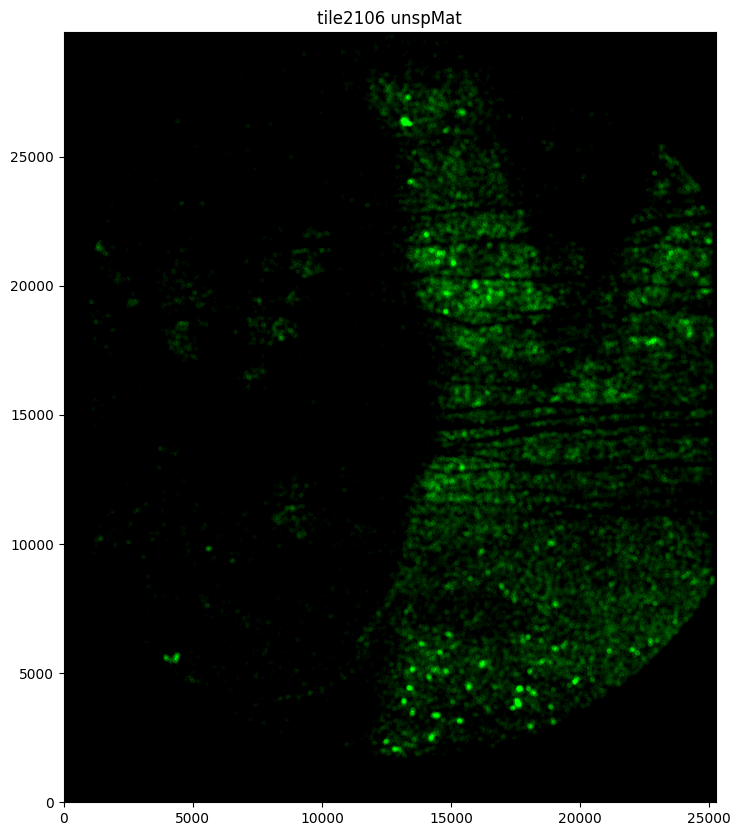

In [51]:
##### check unsp viz
fig, ax = plt.subplots(1,1, figsize=(10,10))
ax.imshow(unspMat, 
          cmap='green_alpha',
          vmin=10,
          vmax=100,
          origin='lower')

ax.set_aspect('equal', adjustable='box')
ax.set_title('tile'+str(t)+' unspMat')
ax.grid(False)
ax.set_facecolor('black')
# plt.tight_layout()

In [52]:
##### transform image to align with unspMat

# original im and outlines
im = dat_H['img']
outlines = dat_H['outlines']
masks = dat_H['masks']

# 1. crop
# points for cropped image
left = 4900 # <<<<<
top = 120 # <<<<<
right = 5510 # <<<<<
bottom = 1300 # <<<<<

im1 = im[top:bottom, left:right]
outlines1 = outlines[top:bottom, left:right]
masks1 = masks[top:bottom, left:right]

# 2. resize
height, width = list(im1.shape)
dim2 = (int(width*9.3*2.5), int(height*9.1*2.5)) # <<<

im2 = cv2.resize(im1, dim2, interpolation = cv2.INTER_NEAREST)
outlines2 = cv2.resize(outlines1, dim2, interpolation = cv2.INTER_NEAREST)
masks2 = cv2.resize(masks1, dim2, interpolation = cv2.INTER_NEAREST)

# 3. flip
im3 = np.flip(im2, axis=0)
outlines3 = np.flip(outlines2, axis=0)
masks3 = np.flip(masks2, axis=0)

# 4. padding
dim4 = list(unspMat.shape)
im4 = np.zeros(dim4)
outlines4 = np.zeros(dim4)
masks4 = np.zeros(dim4)

left = 10300 # <<<
top = 2000 # <<<

im4[top:(top+dim2[1]), left:(left+dim2[0])] = im3
outlines4[top:(top+dim2[1]), left:(left+dim2[0])] = outlines3
masks4[top:(top+dim2[1]), left:(left+dim2[0])] = masks3

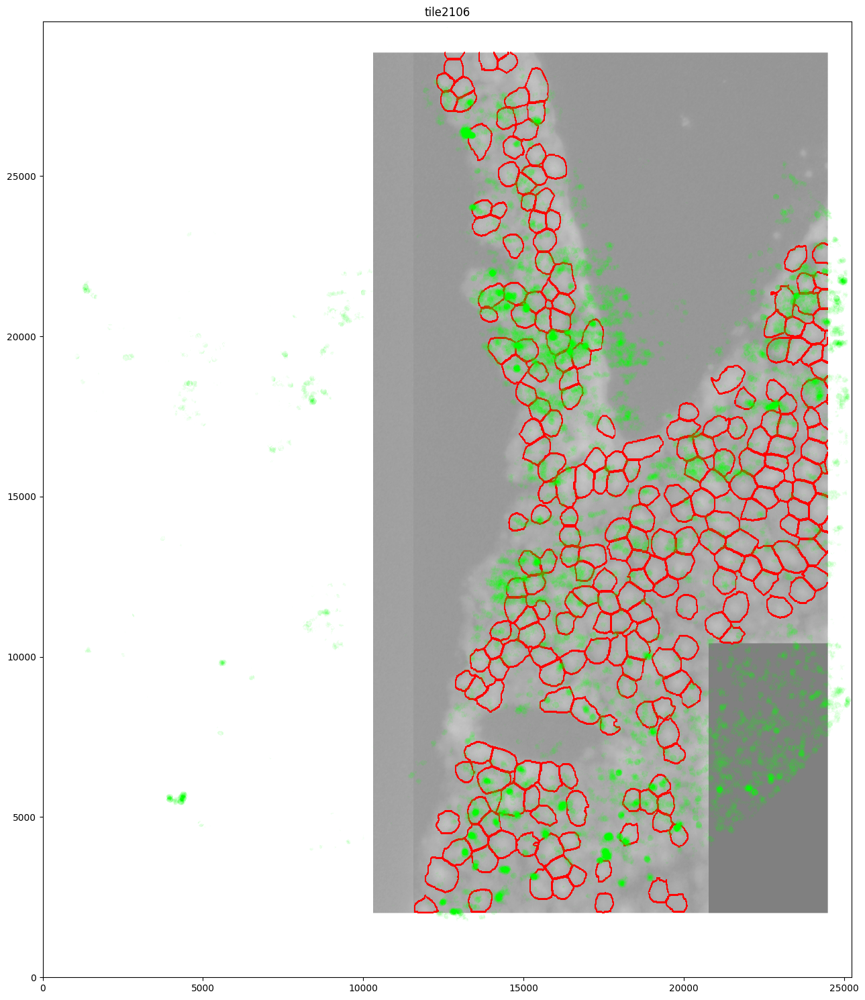

In [53]:
##### overlay image + unspMat

fig, ax = plt.subplots(1,1, figsize=(15,15))

# image
ax.imshow(im4, 
          alpha=0.5, 
          cmap='Greys',
          origin='lower')
# outlines
ax.imshow(outlines4, alpha=1, vmin=0, vmax=2, cmap='red_alpha',
          origin='lower')
# unspMat
ax.imshow(unspMat, 
          cmap='green_alpha',
          vmin=20,
          vmax=80,
          origin='lower')

ax.set_aspect('equal', adjustable='box')


# mask
# ax[1].imshow((masks4==410)*1, alpha=1, cmap='jet',
#              origin='lower')
# ax[1].set_aspect('equal', adjustable='box')

ax.set_title('tile'+str(t))
# ax.grid(False)
# ax.set_facecolor('black')
# plt.suptitle('sp+unsp\n\n')
plt.tight_layout()
fig.savefig('output_fig/step3_align_tile'+str(t)+'.pdf')

In [54]:
##### save aligned segmentation mask (that is aligned with spatial gene expression)
print(im4.shape, outlines4.shape, masks4.shape, unspMat.shape, spMat.shape)

outfile = 'output_step3/masks_4X_tile'+str(t)+'_dict.pkl'
# save
pickle_dict = {}
pickle_dict['im'+str(t)] = im4
pickle_dict['outline'+str(t)] = outlines4
pickle_dict['mask'+str(t)] = masks4
pickle_dict['unspMat'+str(t)] = unspMat
pickle_dict['spMat'+str(t)] = spMat
with open(outfile, 'wb') as f:
    pickle.dump(pickle_dict, f)

(29813, 25244) (29813, 25244) (29813, 25244) (29813, 25244) (29819, 25246)


##### Tile 2118

In [7]:
##### unsp data
t = 2118
t_sp = sp_gbtile.get_group(t) 
t_unsp = unsp_gbtile.get_group(t)

In [8]:
##### compute unspMat
start = timeit.default_timer()

# an empty matrix
unspMat = np.zeros((t_unsp.x.max()+100, t_unsp.y.max()+100), dtype=int)
print(unspMat.shape)

# compute unspMat
for i in range(t_unsp.x.size):
    if i % 1e3 == 0:
        sys.stdout.write('' * 50 + '\r' + str(i/t_unsp.x.size)) # percentage progress
        sys.stdout.flush()

    xi = t_unsp.x.iloc[i]
    yi = t_unsp.y.iloc[i]
    unspMat[int(xi-kn/2):int(xi+kn/2), int(yi-kn/2):int(yi+kn/2)] = unspMat[int(xi-kn/2):int(xi+kn/2), int(yi-kn/2):int(yi+kn/2)] + t_unsp.umi.iloc[i]*kernalCir

stop = timeit.default_timer()
print('\n Time: ', stop - start) # ~1min

(29804, 25268)
0.995293226226939764
 Time:  51.92019895929843


In [9]:
##### compute spMat
start = timeit.default_timer()

# an empty matrix
spMat = np.zeros((t_sp.x.max()+100, t_sp.y.max()+100), dtype=int)
print(spMat.shape)

# compute unspMat
for i in range(t_sp.x.size):
    if i % 1e3 == 0:
        sys.stdout.write('' * 50 + '\r' + str(i/t_sp.x.size)) # percentage progress
        sys.stdout.flush()

    xi = t_sp.x.iloc[i]
    yi = t_sp.y.iloc[i]
    spMat[int(xi-kn/2):int(xi+kn/2), int(yi-kn/2):int(yi+kn/2)] = spMat[int(xi-kn/2):int(xi+kn/2), int(yi-kn/2):int(yi+kn/2)] + t_sp.umi.iloc[i]*kernalCir

stop = timeit.default_timer()
print('\n Time: ', stop - start) # ~3min

print(np.quantile(spMat, [0.1,0.5,0.9,0.99,1]))

(29813, 25269)
0.9994532496576832767
 Time:  200.6646642247215
[   0.  107.  261.  439. 1009.]


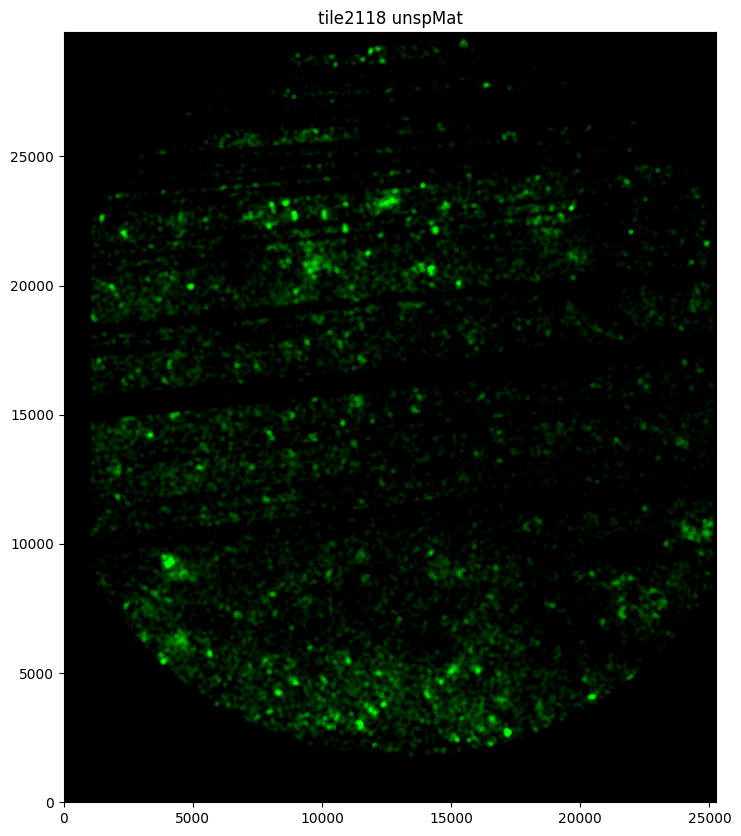

In [10]:
##### check unsp viz
fig, ax = plt.subplots(1,1, figsize=(10,10))
ax.imshow(unspMat, 
          cmap='green_alpha',
          vmin=10,
          vmax=80,
          origin='lower')

ax.set_aspect('equal', adjustable='box')
ax.set_title('tile'+str(t)+' unspMat')
ax.grid(False)
ax.set_facecolor('black')
# plt.tight_layout()

In [11]:
##### transform image to align with unspMat

# original im and outlines
im = dat_TD['img']
outlines = dat_TD['outlines']
masks = dat_TD['masks']

# 1. crop
# points for cropped image
left = 2350 # <<<<<
top = 0 # <<<<<
right = 3350 # <<<<<
bottom = 1180 # <<<<<

im1 = im[top:bottom, left:right]
outlines1 = outlines[top:bottom, left:right]
masks1 = masks[top:bottom, left:right]

# 2. resize
height, width = list(im1.shape)
dim2 = (int(width*9.3*2.5), int(height*9.1*2.5)) # <<<

im2 = cv2.resize(im1, dim2, interpolation = cv2.INTER_NEAREST)
outlines2 = cv2.resize(outlines1, dim2, interpolation = cv2.INTER_NEAREST)
masks2 = cv2.resize(masks1, dim2, interpolation = cv2.INTER_NEAREST)

# 3. flip
im3 = np.flip(im2, axis=0)
outlines3 = np.flip(outlines2, axis=0)
masks3 = np.flip(masks2, axis=0)

# 4. padding
dim4 = list(unspMat.shape)
im4 = np.full(dim4,255)
outlines4 = np.zeros(dim4)
masks4 = np.zeros(dim4)

left = 1000 # <<<
top = 1290 # <<<

im4[top:(top+dim2[1]), left:(left+dim2[0])] = im3
outlines4[top:(top+dim2[1]), left:(left+dim2[0])] = outlines3
masks4[top:(top+dim2[1]), left:(left+dim2[0])] = masks3

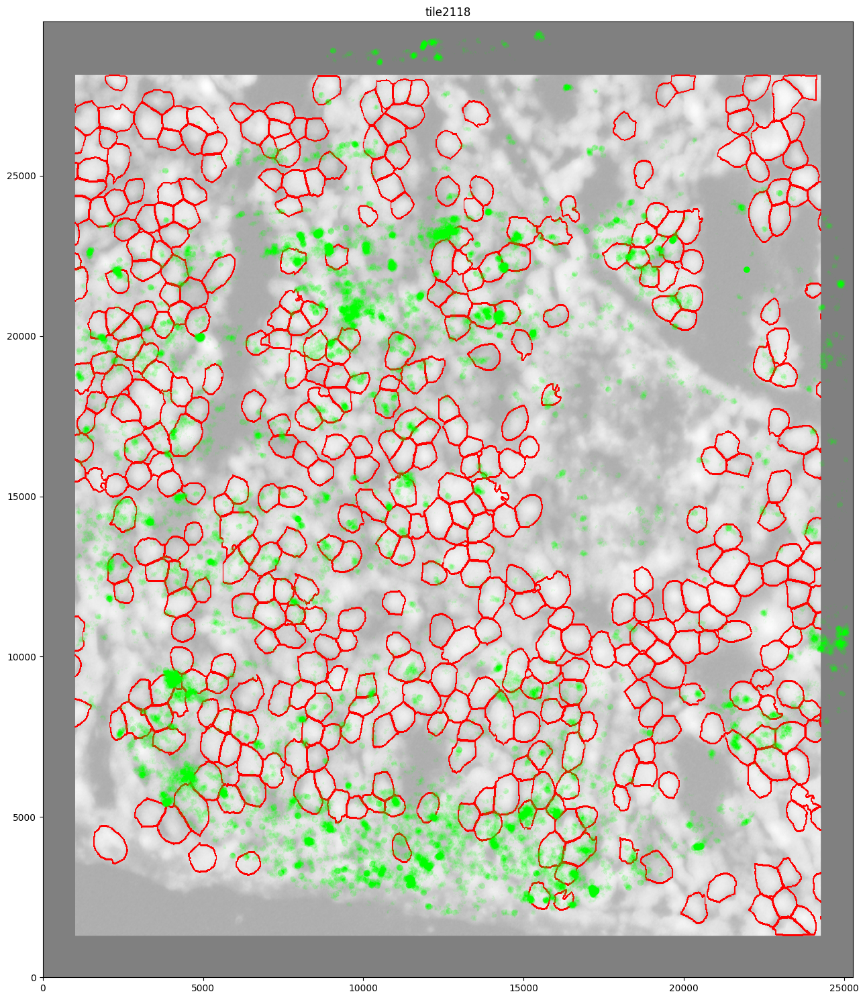

In [12]:
##### overlay image + unspMat

fig, ax = plt.subplots(1,1, figsize=(15,15))

# image
ax.imshow(im4, 
          alpha=0.5, 
          cmap='Greys',
          origin='lower')
# outlines
ax.imshow(outlines4, alpha=1, vmin=0, vmax=2, cmap='red_alpha',
          origin='lower')
# unspMat
ax.imshow(unspMat, 
          cmap='green_alpha',
          vmin=15,
          vmax=50,
          origin='lower')

ax.set_aspect('equal', adjustable='box')


# mask
# ax[1].imshow((masks4==410)*1, alpha=1, cmap='jet',
#              origin='lower')
# ax[1].set_aspect('equal', adjustable='box')

ax.set_title('tile'+str(t))
# ax.grid(False)
# ax.set_facecolor('black')
# plt.suptitle('sp+unsp\n\n')
plt.tight_layout()
fig.savefig('output_fig/step3_align_tile'+str(t)+'.pdf')

In [13]:
##### save aligned segmentation mask (that is aligned with spatial gene expression)
print(im4.shape, outlines4.shape, masks4.shape, unspMat.shape, spMat.shape)

outfile = 'output_step3/masks_4X_tile'+str(t)+'_dict.pkl'
# save
pickle_dict = {}
pickle_dict['im'+str(t)] = im4
pickle_dict['outline'+str(t)] = outlines4
pickle_dict['mask'+str(t)] = masks4
pickle_dict['unspMat'+str(t)] = unspMat
pickle_dict['spMat'+str(t)] = spMat
with open(outfile, 'wb') as f:
    pickle.dump(pickle_dict, f)

(29804, 25268) (29804, 25268) (29804, 25268) (29804, 25268) (29813, 25269)


##### Tile 2116

In [14]:
##### unsp data
t = 2116
t_sp = sp_gbtile.get_group(t) 
t_unsp = unsp_gbtile.get_group(t)

In [15]:
##### compute unspMat
start = timeit.default_timer()

# an empty matrix
unspMat = np.zeros((t_unsp.x.max()+100, t_unsp.y.max()+100), dtype=int)
print(unspMat.shape)

# compute unspMat
for i in range(t_unsp.x.size):
    if i % 1e3 == 0:
        sys.stdout.write('' * 50 + '\r' + str(i/t_unsp.x.size)) # percentage progress
        sys.stdout.flush()

    xi = t_unsp.x.iloc[i]
    yi = t_unsp.y.iloc[i]
    unspMat[int(xi-kn/2):int(xi+kn/2), int(yi-kn/2):int(yi+kn/2)] = unspMat[int(xi-kn/2):int(xi+kn/2), int(yi-kn/2):int(yi+kn/2)] + t_unsp.umi.iloc[i]*kernalCir

stop = timeit.default_timer()
print('\n Time: ', stop - start) # ~1min

(29808, 25267)
0.999431977509185436
 Time:  41.67860815767199


In [16]:
##### compute spMat
start = timeit.default_timer()

# an empty matrix
spMat = np.zeros((t_sp.x.max()+100, t_sp.y.max()+100), dtype=int)
print(spMat.shape)

# compute unspMat
for i in range(t_sp.x.size):
    if i % 1e3 == 0:
        sys.stdout.write('' * 50 + '\r' + str(i/t_sp.x.size)) # percentage progress
        sys.stdout.flush()

    xi = t_sp.x.iloc[i]
    yi = t_sp.y.iloc[i]
    spMat[int(xi-kn/2):int(xi+kn/2), int(yi-kn/2):int(yi+kn/2)] = spMat[int(xi-kn/2):int(xi+kn/2), int(yi-kn/2):int(yi+kn/2)] + t_sp.umi.iloc[i]*kernalCir

stop = timeit.default_timer()
print('\n Time: ', stop - start) # ~3min

print(np.quantile(spMat, [0.1,0.5,0.9,0.99,1]))

(29816, 25268)
0.9990849502324973465
 Time:  175.63565748371184
[  0.  62. 204. 349. 709.]


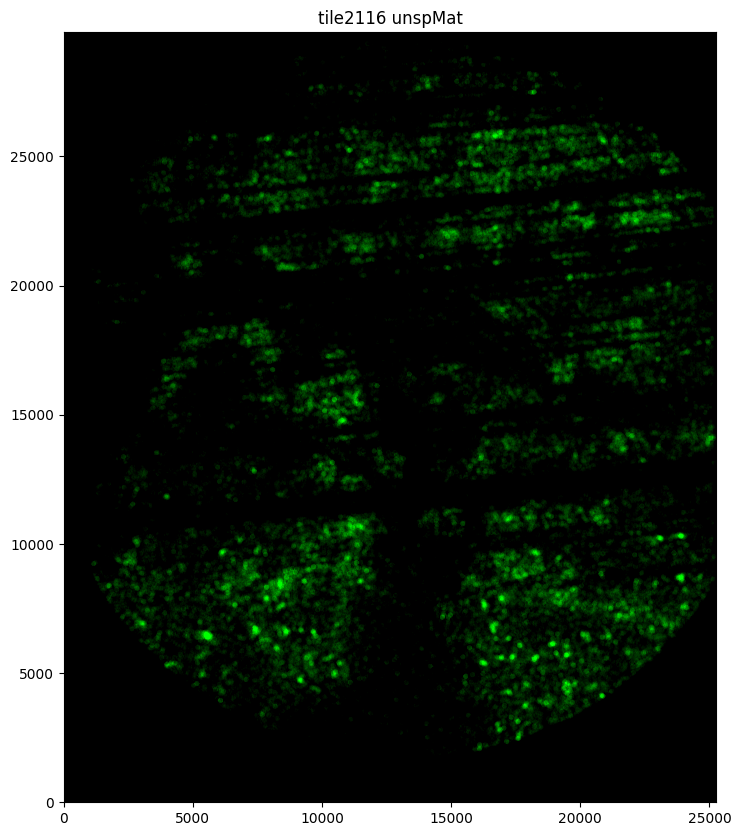

In [17]:
##### check unsp viz
fig, ax = plt.subplots(1,1, figsize=(10,10))
ax.imshow(unspMat, 
          cmap='green_alpha',
          vmin=10,
          vmax=80,
          origin='lower')

ax.set_aspect('equal', adjustable='box')
ax.set_title('tile'+str(t)+' unspMat')
ax.grid(False)
ax.set_facecolor('black')
# plt.tight_layout()

In [18]:
##### transform image to align with unspMat

# original im and outlines
im = dat_TD['img']
outlines = dat_TD['outlines']
masks = dat_TD['masks']

# 1. crop
# points for cropped image
left = 150 # <<<<<
top = 0 # <<<<<
right = 1150 # <<<<<
bottom = 1180 # <<<<<

im1 = im[top:bottom, left:right]
outlines1 = outlines[top:bottom, left:right]
masks1 = masks[top:bottom, left:right]

# 2. resize
height, width = list(im1.shape)
dim2 = (int(width*9.3*2.5), int(height*9.1*2.5)) # <<<

im2 = cv2.resize(im1, dim2, interpolation = cv2.INTER_NEAREST)
outlines2 = cv2.resize(outlines1, dim2, interpolation = cv2.INTER_NEAREST)
masks2 = cv2.resize(masks1, dim2, interpolation = cv2.INTER_NEAREST)

# 3. flip
im3 = np.flip(im2, axis=0)
outlines3 = np.flip(outlines2, axis=0)
masks3 = np.flip(masks2, axis=0)

# 4. padding
dim4 = list(unspMat.shape)
im4 = np.full(dim4,255)
outlines4 = np.zeros(dim4)
masks4 = np.zeros(dim4)

left = 1500 # <<<
top = 300 # <<<

im4[top:(top+dim2[1]), left:(left+dim2[0])] = im3
outlines4[top:(top+dim2[1]), left:(left+dim2[0])] = outlines3
masks4[top:(top+dim2[1]), left:(left+dim2[0])] = masks3

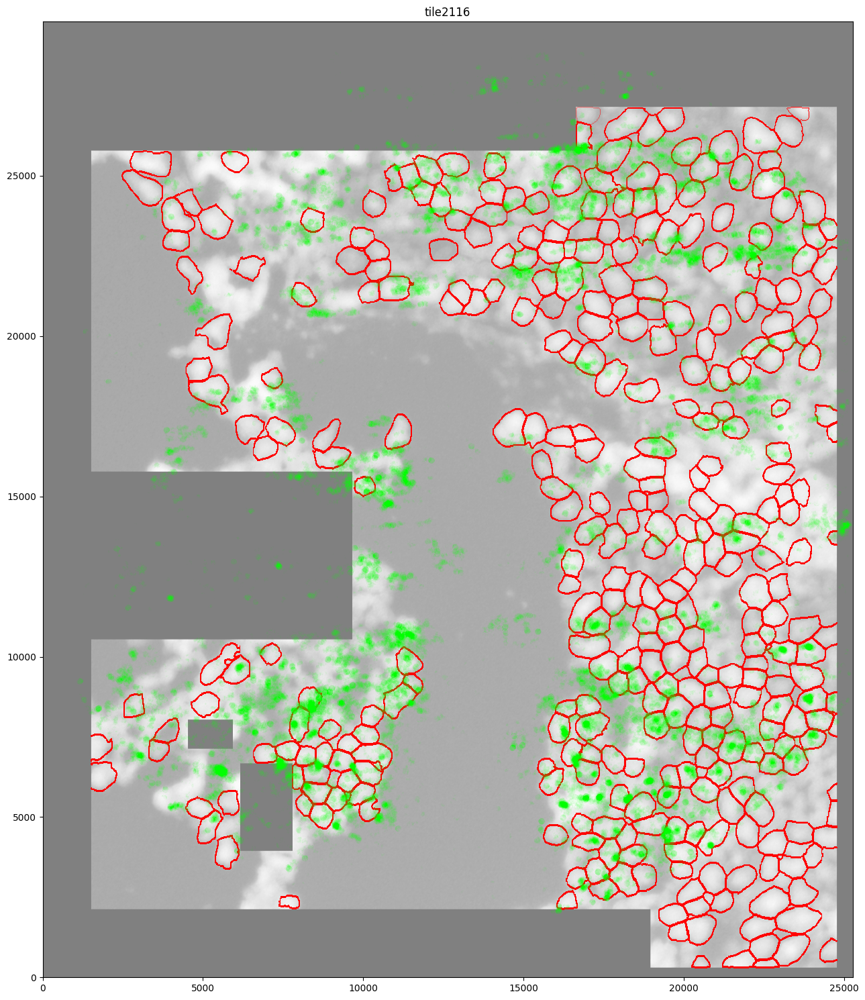

In [19]:
##### overlay image + unspMat

fig, ax = plt.subplots(1,1, figsize=(15,15))

# image
ax.imshow(im4, 
          alpha=0.5, 
          cmap='Greys',
          origin='lower')
# outlines
ax.imshow(outlines4, alpha=1, vmin=0, vmax=2, cmap='red_alpha',
          origin='lower')
# unspMat
ax.imshow(unspMat, 
          cmap='green_alpha',
          vmin=15,
          vmax=60,
          origin='lower')

ax.set_aspect('equal', adjustable='box')


# mask
# ax[1].imshow((masks4==410)*1, alpha=1, cmap='jet',
#              origin='lower')
# ax[1].set_aspect('equal', adjustable='box')

ax.set_title('tile'+str(t))
# ax.grid(False)
# ax.set_facecolor('black')
# plt.suptitle('sp+unsp\n\n')
plt.tight_layout()
fig.savefig('output_fig/step3_align_tile'+str(t)+'.pdf')

In [20]:
##### save aligned segmentation mask (that is aligned with spatial gene expression)
print(im4.shape, outlines4.shape, masks4.shape, unspMat.shape, spMat.shape)

outfile = 'output_step3/masks_4X_tile'+str(t)+'_dict.pkl'
# save
pickle_dict = {}
pickle_dict['im'+str(t)] = im4
pickle_dict['outline'+str(t)] = outlines4
pickle_dict['mask'+str(t)] = masks4
pickle_dict['unspMat'+str(t)] = unspMat
pickle_dict['spMat'+str(t)] = spMat
with open(outfile, 'wb') as f:
    pickle.dump(pickle_dict, f)

(29808, 25267) (29808, 25267) (29808, 25267) (29808, 25267) (29816, 25268)


##### Tile 2117

In [21]:
##### unsp data
t = 2117
t_sp = sp_gbtile.get_group(t) 
t_unsp = unsp_gbtile.get_group(t)

In [22]:
##### compute unspMat
start = timeit.default_timer()

# an empty matrix
unspMat = np.zeros((t_unsp.x.max()+100, t_unsp.y.max()+100), dtype=int)
print(unspMat.shape)

# compute unspMat
for i in range(t_unsp.x.size):
    if i % 1e3 == 0:
        sys.stdout.write('' * 50 + '\r' + str(i/t_unsp.x.size)) # percentage progress
        sys.stdout.flush()

    xi = t_unsp.x.iloc[i]
    yi = t_unsp.y.iloc[i]
    unspMat[int(xi-kn/2):int(xi+kn/2), int(yi-kn/2):int(yi+kn/2)] = unspMat[int(xi-kn/2):int(xi+kn/2), int(yi-kn/2):int(yi+kn/2)] + t_unsp.umi.iloc[i]*kernalCir

stop = timeit.default_timer()
print('\n Time: ', stop - start) # ~1min

(29818, 25270)
0.998978445770144635
 Time:  52.54904272407293


In [23]:
##### compute spMat
start = timeit.default_timer()

# an empty matrix
spMat = np.zeros((t_sp.x.max()+100, t_sp.y.max()+100), dtype=int)
print(spMat.shape)

# compute unspMat
for i in range(t_sp.x.size):
    if i % 1e3 == 0:
        sys.stdout.write('' * 50 + '\r' + str(i/t_sp.x.size)) # percentage progress
        sys.stdout.flush()

    xi = t_sp.x.iloc[i]
    yi = t_sp.y.iloc[i]
    spMat[int(xi-kn/2):int(xi+kn/2), int(yi-kn/2):int(yi+kn/2)] = spMat[int(xi-kn/2):int(xi+kn/2), int(yi-kn/2):int(yi+kn/2)] + t_sp.umi.iloc[i]*kernalCir

stop = timeit.default_timer()
print('\n Time: ', stop - start) # ~3min

print(np.quantile(spMat, [0.1,0.5,0.9,0.99,1]))

(29818, 25270)
0.9997154775545996556
 Time:  193.73112299945205
[  0. 124. 271. 422. 903.]


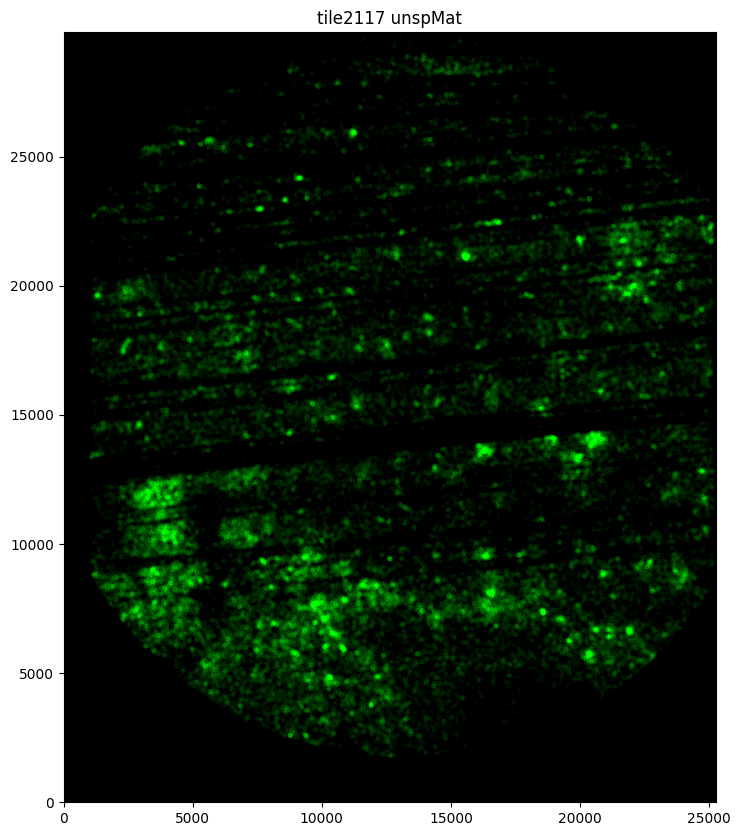

In [24]:
##### check unsp viz
fig, ax = plt.subplots(1,1, figsize=(10,10))
ax.imshow(unspMat, 
          cmap='green_alpha',
          vmin=10,
          vmax=80,
          origin='lower')

ax.set_aspect('equal', adjustable='box')
ax.set_title('tile'+str(t)+' unspMat')
ax.grid(False)
ax.set_facecolor('black')
# plt.tight_layout()

In [25]:
##### transform image to align with unspMat

# original im and outlines
im = dat_TD['img']
outlines = dat_TD['outlines']
masks = dat_TD['masks']

# 1. crop
# points for cropped image
left = 1250 # <<<<<
top = 0 # <<<<<
right = 2250 # <<<<<
bottom = 1180 # <<<<<

im1 = im[top:bottom, left:right]
outlines1 = outlines[top:bottom, left:right]
masks1 = masks[top:bottom, left:right]

# 2. resize
height, width = list(im1.shape)
dim2 = (int(width*9.3*2.5), int(height*9.1*2.5)) # <<<

im2 = cv2.resize(im1, dim2, interpolation = cv2.INTER_NEAREST)
outlines2 = cv2.resize(outlines1, dim2, interpolation = cv2.INTER_NEAREST)
masks2 = cv2.resize(masks1, dim2, interpolation = cv2.INTER_NEAREST)

# 3. flip
im3 = np.flip(im2, axis=0)
outlines3 = np.flip(outlines2, axis=0)
masks3 = np.flip(masks2, axis=0)

# 4. padding
dim4 = list(unspMat.shape)
im4 = np.full(dim4,255)
outlines4 = np.zeros(dim4)
masks4 = np.zeros(dim4)

left = 1100 # <<<
top = 500 # <<<

im4[top:(top+dim2[1]), left:(left+dim2[0])] = im3
outlines4[top:(top+dim2[1]), left:(left+dim2[0])] = outlines3
masks4[top:(top+dim2[1]), left:(left+dim2[0])] = masks3

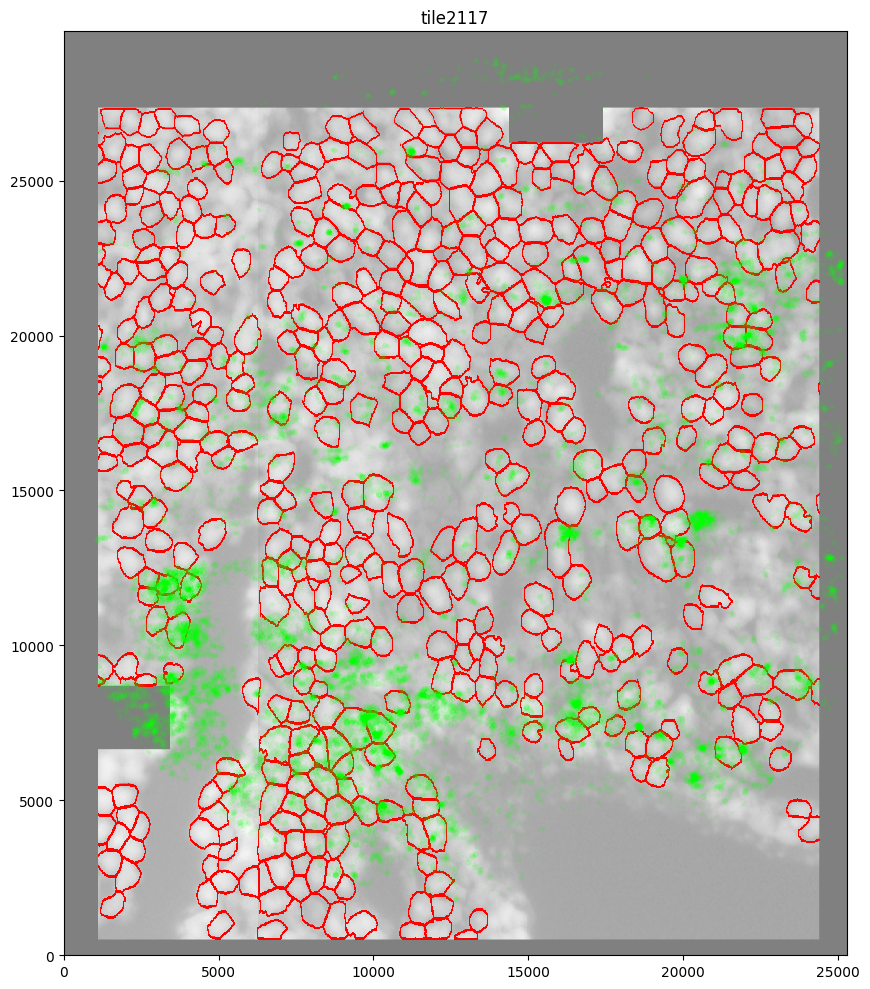

In [26]:
##### overlay image + unspMat

fig, ax = plt.subplots(1,1, figsize=(10,10))

# image
ax.imshow(im4, 
          alpha=0.5, 
          cmap='Greys',
          origin='lower')
# outlines
ax.imshow(outlines4, alpha=1, vmin=0, vmax=2, cmap='red_alpha',
          origin='lower')
# unspMat
ax.imshow(unspMat, 
          cmap='green_alpha',
          vmin=15,
          vmax=80,
          origin='lower')

ax.set_aspect('equal', adjustable='box')


# mask
# ax[1].imshow((masks4==410)*1, alpha=1, cmap='jet',
#              origin='lower')
# ax[1].set_aspect('equal', adjustable='box')

ax.set_title('tile'+str(t))
# ax.grid(False)
# ax.set_facecolor('black')
# plt.suptitle('sp+unsp\n\n')
plt.tight_layout()
fig.savefig('output_fig/step3_align_tile'+str(t)+'.pdf')

In [27]:
##### save aligned segmentation mask (that is aligned with spatial gene expression)
print(im4.shape, outlines4.shape, masks4.shape, unspMat.shape, spMat.shape)

outfile = 'output_step3/masks_4X_tile'+str(t)+'_dict.pkl'
# save
pickle_dict = {}
pickle_dict['im'+str(t)] = im4
pickle_dict['outline'+str(t)] = outlines4
pickle_dict['mask'+str(t)] = masks4
pickle_dict['unspMat'+str(t)] = unspMat
pickle_dict['spMat'+str(t)] = spMat
with open(outfile, 'wb') as f:
    pickle.dump(pickle_dict, f)

(29818, 25270) (29818, 25270) (29818, 25270) (29818, 25270) (29818, 25270)


##### Tile 2119

In [28]:
##### unsp data
t = 2119
t_sp = sp_gbtile.get_group(t) 
t_unsp = unsp_gbtile.get_group(t)

In [29]:
##### compute unspMat
start = timeit.default_timer()

# an empty matrix
unspMat = np.zeros((t_unsp.x.max()+100, t_unsp.y.max()+100), dtype=int)
print(unspMat.shape)

# compute unspMat
for i in range(t_unsp.x.size):
    if i % 1e3 == 0:
        sys.stdout.write('' * 50 + '\r' + str(i/t_unsp.x.size)) # percentage progress
        sys.stdout.flush()

    xi = t_unsp.x.iloc[i]
    yi = t_unsp.y.iloc[i]
    unspMat[int(xi-kn/2):int(xi+kn/2), int(yi-kn/2):int(yi+kn/2)] = unspMat[int(xi-kn/2):int(xi+kn/2), int(yi-kn/2):int(yi+kn/2)] + t_unsp.umi.iloc[i]*kernalCir

stop = timeit.default_timer()
print('\n Time: ', stop - start) # ~1min

(29819, 25274)
0.995743197829279846
 Time:  49.681028021499515


In [30]:
##### compute spMat
start = timeit.default_timer()

# an empty matrix
spMat = np.zeros((t_sp.x.max()+100, t_sp.y.max()+100), dtype=int)
print(spMat.shape)

# compute unspMat
for i in range(t_sp.x.size):
    if i % 1e3 == 0:
        sys.stdout.write('' * 50 + '\r' + str(i/t_sp.x.size)) # percentage progress
        sys.stdout.flush()

    xi = t_sp.x.iloc[i]
    yi = t_sp.y.iloc[i]
    spMat[int(xi-kn/2):int(xi+kn/2), int(yi-kn/2):int(yi+kn/2)] = spMat[int(xi-kn/2):int(xi+kn/2), int(yi-kn/2):int(yi+kn/2)] + t_sp.umi.iloc[i]*kernalCir

stop = timeit.default_timer()
print('\n Time: ', stop - start) # ~3min

print(np.quantile(spMat, [0.1,0.5,0.9,0.99,1]))

(29820, 25274)
0.9985410822661326345
 Time:  189.82859968580306
[   0.  115.  278.  466. 1039.]


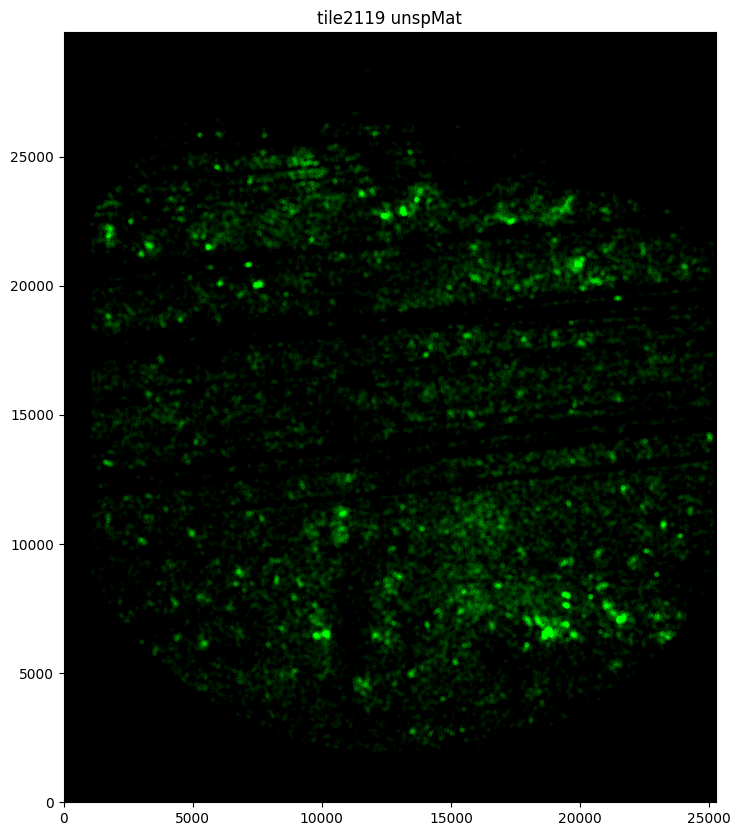

In [31]:
##### check unsp viz
fig, ax = plt.subplots(1,1, figsize=(10,10))
ax.imshow(unspMat, 
          cmap='green_alpha',
          vmin=10,
          vmax=80,
          origin='lower')

ax.set_aspect('equal', adjustable='box')
ax.set_title('tile'+str(t)+' unspMat')
ax.grid(False)
ax.set_facecolor('black')
# plt.tight_layout()

In [32]:
##### transform image to align with unspMat

# original im and outlines
im = dat_TD['img']
outlines = dat_TD['outlines']
masks = dat_TD['masks']

# 1. crop
# points for cropped image
left = 3450 # <<<<<
top = 0 # <<<<<
right = 4450 # <<<<<
bottom = 1180 # <<<<<

im1 = im[top:bottom, left:right]
outlines1 = outlines[top:bottom, left:right]
masks1 = masks[top:bottom, left:right]

# 2. resize
height, width = list(im1.shape)
dim2 = (int(width*9.3*2.5), int(height*9.1*2.5)) # <<<

im2 = cv2.resize(im1, dim2, interpolation = cv2.INTER_NEAREST)
outlines2 = cv2.resize(outlines1, dim2, interpolation = cv2.INTER_NEAREST)
masks2 = cv2.resize(masks1, dim2, interpolation = cv2.INTER_NEAREST)

# 3. flip
im3 = np.flip(im2, axis=0)
outlines3 = np.flip(outlines2, axis=0)
masks3 = np.flip(masks2, axis=0)

# 4. padding
dim4 = list(unspMat.shape)
im4 = np.full(dim4,255)
outlines4 = np.zeros(dim4)
masks4 = np.zeros(dim4)

left = 900 # <<<
top = 1300 # <<<

im4[top:(top+dim2[1]), left:(left+dim2[0])] = im3
outlines4[top:(top+dim2[1]), left:(left+dim2[0])] = outlines3
masks4[top:(top+dim2[1]), left:(left+dim2[0])] = masks3

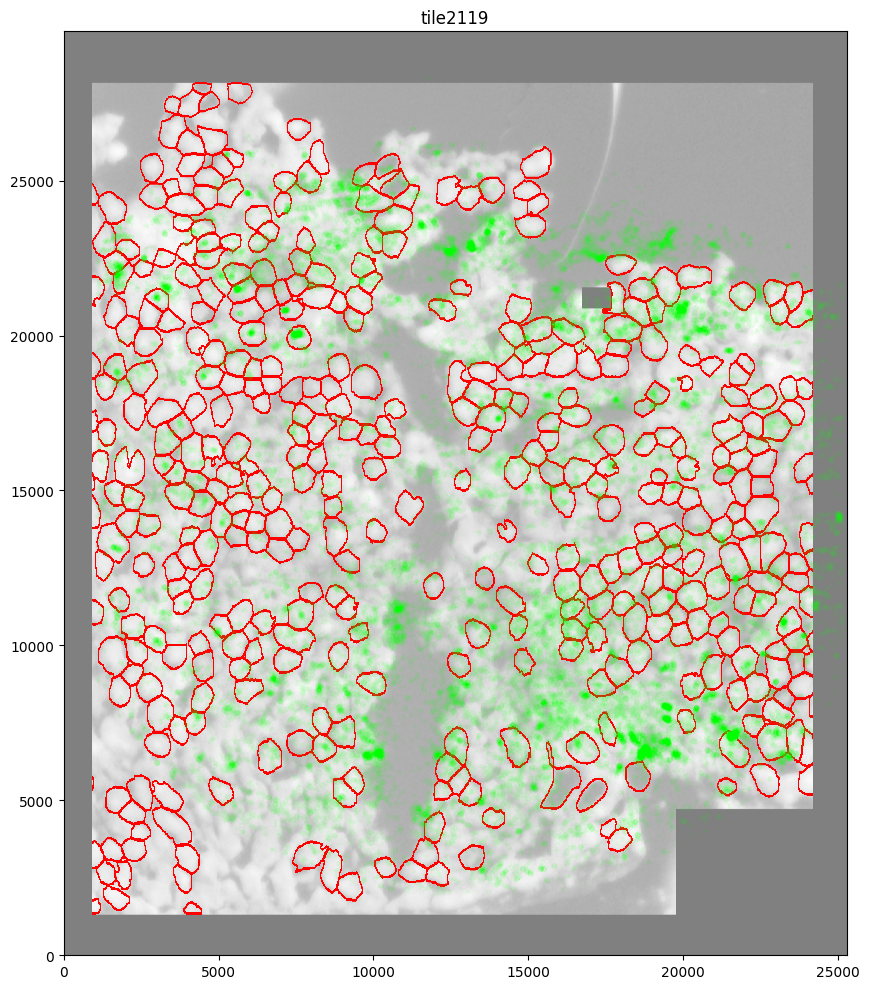

In [33]:
##### overlay image + unspMat

fig, ax = plt.subplots(1,1, figsize=(10,10))

# image
ax.imshow(im4, 
          alpha=0.5, 
          cmap='Greys',
          origin='lower')
# outlines
ax.imshow(outlines4, alpha=1, vmin=0, vmax=2, cmap='red_alpha',
          origin='lower')
# unspMat
ax.imshow(unspMat, 
          cmap='green_alpha',
          vmin=10,
          vmax=70,
          origin='lower')

ax.set_aspect('equal', adjustable='box')


# mask
# ax[1].imshow((masks4==410)*1, alpha=1, cmap='jet',
#              origin='lower')
# ax[1].set_aspect('equal', adjustable='box')

ax.set_title('tile'+str(t))
# ax.grid(False)
# ax.set_facecolor('black')
# plt.suptitle('sp+unsp\n\n')
plt.tight_layout()
fig.savefig('output_fig/step3_align_tile'+str(t)+'.pdf')

In [34]:
##### save aligned segmentation mask (that is aligned with spatial gene expression)
print(im4.shape, outlines4.shape, masks4.shape, unspMat.shape, spMat.shape)

outfile = 'output_step3/masks_4X_tile'+str(t)+'_dict.pkl'
# save
pickle_dict = {}
pickle_dict['im'+str(t)] = im4
pickle_dict['outline'+str(t)] = outlines4
pickle_dict['mask'+str(t)] = masks4
pickle_dict['unspMat'+str(t)] = unspMat
pickle_dict['spMat'+str(t)] = spMat
with open(outfile, 'wb') as f:
    pickle.dump(pickle_dict, f)

(29819, 25274) (29819, 25274) (29819, 25274) (29819, 25274) (29820, 25274)
